In [1]:
import numpy as np
from scipy.integrate import odeint
import matplotlib.pyplot as plt
import random

## SEIR differential equations

In [2]:
def deriv(y, t, N, beta, gamma, q, sigma, alpha):
    S, E, I, R = y
    dSdt = - beta * S * I * (1 - q) / N - alpha * S * E / N
    dEdt = (beta * S * I * (1-q)/N) - sigma * E + alpha*S*E/N
    dIdt = sigma * E - gamma * I
    dRdt = gamma * I
    return dSdt, dEdt, dIdt, dRdt


In [3]:
# Helper functions

# converting decimal to binary
# output type: string
def decimalToBinary(j):  
    return bin(j).replace("0b", "")

def mkdir_p(mypath):
    '''Creates a directory. equivalent to using mkdir -p on the command line'''
    from errno import EEXIST
    from os import makedirs,path

    try:
        makedirs(mypath)
    except OSError as exc: # Python >2.5
        if exc.errno == EEXIST and path.isdir(mypath):
            pass
        else: raise

## Random Matrix Generation Functions

In [4]:
def permutation_matrix(size):
    #Source: https://unstabnet.in/site/generate-permutation-matrix-in-numpy/
    I = np.identity(size)  #size X size identity matrix 
    rr = list(range(size))
    np.random.shuffle(rr)
    
    permutation = np.array([list(range(size)),rr])
 
    P = np.zeros([size,size]) #initialize the permutation matrix
 
    for i in range(0,size):
        P[i] = I[permutation[1][i]]
    return P

def prob_vector(m):
    rand_nums = np.random.uniform(size=m)
    vector = rand_nums/rand_nums.sum()
    return vector

def left_sto(m, size):
    q = np.random.uniform(size=m)
    for i in range(m):
        mat = permutation_matrix(size)
        weighted_mat = q[i]*mat
        if i == 0:
            summed_mat = weighted_mat
        else:
            summed_mat += weighted_mat
    temp = summed_mat.transpose()
    for row in range(len(temp)):
        old = temp[row]
        temp[row] = old/old.sum()
    final = temp.transpose()
    return final

def invert(matrix, original_vector):
    #Bij = Aji * vi / dot(Row j of A, v) if the dot product is nonzero, and Bij = 0 otherwise. 
    size = len(matrix)
    inverse = np.empty((size,size))
    for i in range(size):
        for j in range(size):
            dot_prod = np.dot(matrix[j],original_vector)
            if dot_prod != 0:
                inverse[i][j] = matrix[j][i] * original_vector[i]/dot_prod
            else:
                inverse[i][j] = 0
    return inverse


def large_gathering(size, p):
    mat = np.identity(size) * p
    for i in range(size):
        mat[size - 1][i] = (1-p)
        mat[size - 1][size - 1] = 1
    return mat   


# for each box p fraction stays within box, the rest travel to other boxes equally likely 
def uniform_mixing(size, p):
    mat = np.identity(size) * p
    for i in range(size):
        for j in range(size):
            if i != j:
                mat[i][j] = (1 - p) / (size - 1)
    return mat

# multi-modal version of uniform_mixing: 
# p is an array of mixing proportions, and radius is an array of travel radius (proportion of size)
# NOTE: p_travel is the % that travels, where p in previous function is the percentage that stays
def multimodal_travel(size, p_travel, radius):
    # Create a vector that represents the travel proportion for one place
    travel_vector = np.zeros(size)
    travel_vector[0] = 1 - np.sum(p_travel)
    
    for k in range(len(p_travel)):
        if radius[k] > 0:
            # Create a mask with width = radius * size
            intRadius = int(np.ceil(radius[k] * size))
            mask = np.concatenate((np.ones(intRadius),np.zeros(size - intRadius)))
            mask_size = np.sum(mask)
            if mask_size == 0:
                print("MASK SIZE == 0!!")
                print(radius[k] * size)
                print(intRadius)
                print(radius)
            p = p_travel[k] / mask_size
            travel_vector += mask * p
        
    row_sum = travel_vector.sum()
    travel_vector /= row_sum
        
    # Roll the one-location travel vector to be a full matrix
    mat = np.zeros([size,size])
    for i in range(size):
        mat[i,:] = np.roll(travel_vector, i)
        
    return np.transpose(mat)

In [10]:
sum(np.random.uniform(size=4))

2.2022757632817385

## Single Partition Class (Box)

In [5]:
class Box:
    def __init__(self, N, I0, E0, p, lam, sigma, p2,R0 = 0,gamma = 1./14, v = 0, ve = 0, q = 0):
        '''
        box to represent partitioned population 
        must define N (number of people in box), I0 (number within box initially infected),
        lam (number of people interacted with each timestep), p (infection probability)
        '''
        self.N = N
        self.S0 = N - I0 - R0 - E0
        self.E0 = E0
        self.I0 = I0
        self.R0 = R0
        self.S = N - I0 - R0 - E0
        self.E = E0
        self.I = I0
        self.R = R0
        
        self.safe = 0 #for calculating total infected (don't want to count those immune from vaccine)
        
        # ACCOUNT FOR IF V, VE !=0
        # MAKE SURE THAT S AND R CHANGE ACCORDINGLY
        # AS WELL AS S0 and R0
        if (v * ve > 0):
            old_S0 = self.S0
            self.S0 = old_S0 * (1 - v * ve)
            self.R0 += old_S0 * v * ve
            self.S = self.S0
            self.R = self.R0
            self.safe = old_S0 * v * ve
        
        
        
        
        self.v = v
        self.ve = ve
        #can't interact with more people than in box
        self.lam = min(lam, N)
        self.gamma = gamma
        self.p = p
        self.beta = min(1, lam * p)
        self.q = q
        self.sigma = sigma
        self.p2 = p2
        self.alpha = min(1, lam * p2)
        return
    
    def update_box_params(self, new_lam = None, new_gamma = None, new_p = None, new_p2 = None, new_q = None, new_sigma = None, new_v = None, new_ve = None):
        self.v = new_v if new_v != None else self.v
        self.ve = new_ve if new_ve != None else self.ve
        
        
        # ACCOUNT FOR IF V, VE CHANGES
        # TO MAKE SURE THAT S AND R CHANGE ACCORDINGLY
        # v, ve SHOULD ONLY EVER CHANGE FROM ZERO TO NONZERO 
        if new_v != None:
            if new_ve != None:
                old_S = self.S
                self.S = old_S * (1 - new_ve * new_v)
                self.R += old_S * new_ve * new_v
                self.safe = old_S * new_ve * new_v
                self.S0 = self.S
                self.R0 = self.R
        
        
        
        
        self.gamma = new_gamma if new_gamma != None else self.gamma
        self.p = new_p if new_p != None else self.p
        self.q = new_q if new_q != None else self.q
        self.sigma = new_sigma if new_sigma != None else self.sigma
        self.p2 = new_p2 if new_p2 != None else self.p2
        self.lam = min(new_lam, self.N) if new_lam != None else self.lam
        self.beta = min(1, self.lam * self.p)
        self.alpha = min(1, self.lam * self.p2)
        return
    
    def integrate(self, t):
        # Initial conditions vector
        if isinstance(self.S, (np.ndarray)):
            y0 = self.S[-1], self.E[-1], self.I[-1], self.R[-1]
            # Integrate the SIR equations over the time grid, t.
            ret = odeint(deriv, y0, t, args=(self.N, self.beta, self.gamma, self.q, self.sigma, self.alpha))
            newS, newE, newI, newR = ret.T
            S = np.concatenate([self.S, newS])
            E = np.concatenate([self.E, newE])
            I = np.concatenate([self.I, newI])
            R = np.concatenate([self.R, newR])
            self.S, self.E, self.I, self.R = S, E, I, R
        else:
            y0 = self.S0, self.E0, self.I0, self.R0
            # Integrate the SIR equations over the time grid, t.
            ret = odeint(deriv, y0, t, args=(self.N, self.beta, self.gamma, self.q, self.sigma, self.alpha))
            self.S, self.E, self.I, self.R = ret.T
        self.N = self.S[-1]+self.E[-1]+self.I[-1]+self.R[-1]
        return

## Total Population Class (Group of Partitions)

In [6]:
def generate_deltas(j, initial_SEIR, new_SEIR, int_SEIR, matrices):
    #ds is >0 if people are leaving S group (always true)
    aggregate_dS = abs(int_SEIR[0][j] - new_SEIR[0][j])
    pos_S = True 
    bound_S = np.multiply(matrices[0][j], initial_SEIR[0])
    ds = distribute(aggregate_dS, bound_S, pos_S)
    
    aggregate_dE = sum(ds) - (int_SEIR[1][j] - new_SEIR[1][j])
    #should always be positive, total outflow from E to I
    if aggregate_dE >= 0:
        #more entered E category than left it
        pos_E = True
    else:
        pos_E = False
        aggregate_dE = (-1)*aggregate_dE
    bound_E = np.multiply(matrices[1][j], initial_SEIR[1])
    bound_E = np.add(bound_E, ds)
    de = distribute(aggregate_dE, bound_E, pos_E)
    
    aggregate_dI = sum(de) - (int_SEIR[2][j] - new_SEIR[2][j])
    if aggregate_dI >= 0:
        pos_I = True
    else:
        pos_I = False
        aggregate_dI = (-1)*aggregate_dE
    bound_I = np.multiply(matrices[2][j], initial_SEIR[2])
    bound_I = np.add(bound_I, de)
    #how to deal with some being positive and some being negative in de?
    #int_E[j] - new_E[j] accounts both for delta S in and amount that goes to I, so
    #double counting delta S right now in E?
    #int_E[j] - new_E[j] = Amount from S - Amount to I
    di = distribute(aggregate_dI, bound_I, pos_I)
    
    #check
    #print(sum(di), int_SEIR[3][j]-new_SEIR[3][j])
    
    vs = (-1)*ds
    ve = np.subtract(ds, de)
    vi = np.subtract(de, di)
    vr = di
        
    return vs, ve, vi, vr

def distribute(aggregate_delta, bound_vector, positive):
    
    num_boxes = len(bound_vector)
    vector = np.zeros(num_boxes)
    
    remainder = aggregate_delta - int(aggregate_delta)
    delta = random.choices([int(aggregate_delta),int(aggregate_delta)+1], weights=(1-remainder, remainder), k=1)
    delta = delta[0]
    
    for k in range(delta):
        options = []
        check = np.less_equal(vector + np.ones(num_boxes), bound_vector)
        for i in range(len(check)):
            if check[i] == True:
                options += [i]
        
        if len(options) > 0:
            r = random.choices(options)
            vector[r] = vector[r] + 1
        else:
            diff = np.subtract(bound_vector,vector)
            unit = 1
            counter = 0
            while unit > 0 and counter < num_boxes:
                if diff[counter] < unit:
                    unit -= diff[counter]
                    vector[counter] += diff[counter]
                else:
                    vector[counter] += unit
                    unit = 0
                counter += 1
    
    if positive:
        return vector
    else:
        return (-1)*vector

In [7]:
class Population:
    def __init__(self):
        self.boxes = []
        self.N = 0
        self.S = 0
        self.E = 0
        self.I = 0
        self.R = 0
        self.t = np.zeros(0)
        return
        
    def initialize_uniform_params(self, num_boxes, N_total, p, lam, sigma, p2,gamma = 1./14, v = 0, ve = 0, q = 0):
        box_N = N_total/num_boxes
        self.boxes = []
        for i in range(num_boxes):
            new_box = Box(N=box_N, I0 = 0, E0 = 0, p = p, lam = lam, sigma = sigma, p2 = p2, gamma = gamma, v = v, ve = ve, q = q)
            self.boxes += [new_box]
        self.N = N_total
        return
    
    def initalize_from_boxes(self, box_list):
        self.boxes = box_list
        N = 0
        for box in box_list:
            box_N = box.N
            N += box_N
        self.N = N
        return
    
    def distribute_SEIR(self, E0, I0, method = 1):
        #method = 1 -> random distribution
        num_boxes = len(self.boxes)
        if method == 1:
            rand_nums_i = []
            rand_nums_e = []
            for j in range(I0):
                rand_nums_i += [random.randint(0, num_boxes - 1)]
            for k in range(E0):
                rand_nums_e += [random.randint(0, num_boxes - 1)]
            
            for i in range(num_boxes):
                i_Box = rand_nums_i.count(i)
                e_Box = rand_nums_e.count(i)
                box = self.boxes[i]
                box.E0 = e_Box
                box.I0 = i_Box
                box.S0 -= (i_Box + e_Box)
                box.S -= (i_Box + e_Box)
                box.E = e_Box
                box.I = i_Box
                if box.S0 < 0:
                    print("ERROR - Too many I0, E0 in box", i)
                self.S += box.S
                self.E += box.E
                self.I += box.I
                self.R += box.R
        
        #method = 2 -> ? anything else?
        return
    

    def update_parameters(self, boxes = [], new_lam = None, new_gamma = None, new_p = None, new_p2 = None, new_q = None, new_sigma = None, new_v = None, new_ve = None):
        #boxes is a list of indices representing which boxes to update
        if len(boxes) == 0:
            for box in self.boxes:
                box.update_box_params(new_lam, new_gamma, new_p, new_p2, new_q, new_sigma, new_v, new_ve)
        else:
            for index in boxes:
                self.boxes[index].update_box_params(new_lam, new_gamma, new_p, new_p2, new_q, new_sigma, new_v, new_ve)
        return
    
    def integrate_event(self, num_days, mixing_mats = False, update_param = False):
        #if looking to change parameters for integration, do so before integrating
        #mixing_mats is a list of mixing matrices for S, E, I, R in that order
        
        #Format of update_param: update_param = [[[boxes_to_update], 0,None,0], day to update] depends what you're trying to update
            #keep same order
        
        #generate time vector for integration
        current_time = self.t[-1] if len(self.t) else 0
            
        t = np.linspace(current_time, current_time + num_days, num_days + 1)
        
        if not mixing_mats:
            if not update_param:
                self.integrate_total(t)
            else:
                t1 = np.linspace(current_time, current_time + update_param[1], update_param[1]+1)
                t2 = np.linspace(current_time + update_param[1], current_time + num_days, num_days - update_param[1]+1)
                self.integrate_total(t1)
                self.update_parameters(*update_param[0])
                self.integrate_total(t2)
            return
        
        else:
            S_init = self.box_vector(0)
            E_init = self.box_vector(1)
            I_init = self.box_vector(2)
            R_init = self.box_vector(3)
            inits = [S_init, E_init, I_init, R_init]
            
            #Calculate inverse for given transition matrix
            M_iS = invert(mixing_mats[0], S_init)
            M_iE = invert(mixing_mats[1], E_init)
            M_iI = invert(mixing_mats[2], I_init)
            M_iR = invert(mixing_mats[3], R_init)
            
            # Shuffle with transition matrix
            self.shuffle_pop(mixing_mats[0], mixing_mats[1], mixing_mats[2], mixing_mats[3])
            
            S_new = self.box_vector(0)
            E_new = self.box_vector(1)
            I_new = self.box_vector(2)
            R_new = self.box_vector(3)
            news = [S_new, E_new, I_new, R_new]
            
            #Integrate over mixing time period
            if not update_param:
                self.integrate_total(t)
            else:
                t1 = np.linspace(current_time, current_time + update_param[1], update_param[1]+1)
                t2 = np.linspace(current_time + update_param[1], current_time + num_days, num_days - update_param[1]+1)
                self.integrate_total(t1)
                self.update_parameters(*update_param[0])
                self.integrate_total(t2)
                
            S_int = self.box_vector(0)
            E_int = self.box_vector(1)
            I_int = self.box_vector(2)
            R_int = self.box_vector(3)
            ints = [S_int, E_int, I_int, R_int]
            
            v_S = np.zeros(len(self.boxes))
            v_E = np.zeros(len(self.boxes))
            v_I = np.zeros(len(self.boxes))
            v_R = np.zeros(len(self.boxes))
            
            for j in range(len(self.boxes)):
                vs, ve, vi, vr = generate_deltas(j, inits, news, ints, mixing_mats)
                v_S = np.add(v_S, vs)
                v_E = np.add(v_E, ve)
                v_I = np.add(v_I, vi)
                v_R = np.add(v_R, vr)
            
            #Unshuffle with inverse matrix - may not actually need this
            #self.shuffle_pop(M_iS, M_iE, M_iI, M_iR, entry = -3, update = -2)
            for k in range(len(self.boxes)):
                #Update unmixed population from mixing integration
                self.boxes[k].S[-1] = S_init[k] + v_S[k]
                self.boxes[k].E[-1] = E_init[k] + v_E[k]
                self.boxes[k].I[-1] = I_init[k] + v_I[k]
                self.boxes[k].R[-1] = R_init[k] + v_R[k]
        
        return
    
    def integrate_total(self, t):
        self.boxes[0].integrate(t)
        box = self.boxes[0]
        self.S, self.E, self.I, self.R = box.S, box.E, box.I, box.R
        
        for i in range(1, len(self.boxes)):
            self.boxes[i].integrate(t)
            box = self.boxes[i]
            self.S = np.add(self.S, box.S)
            self.E = np.add(self.E, box.E)
            self.I = np.add(self.I, box.I)
            self.R = np.add(self.R, box.R)
        
        self.t = np.concatenate((self.t, t))
        return
    
    def box_vector(self, label, entry = -1):
        vector = np.empty(len(self.boxes))
        if label == 0:
            for i in range(len(self.boxes)):
                vector[i] = self.boxes[i].S[entry]
        elif label == 1:
            for i in range(len(self.boxes)):
                vector[i] = self.boxes[i].E[entry]
        elif label == 2:
            for i in range(len(self.boxes)):
                vector[i] = self.boxes[i].I[entry]
        elif label == 3:
            for i in range(len(self.boxes)):
                vector[i] = self.boxes[i].R[entry]
        else:
            print("invalid label")
            return
        return vector
    
    def shuffle_pop(self, matrixS, matrixE, matrixI, matrixR, entry = -1, update = -1):
        arr_S = self.box_vector(label = 0, entry = entry)
        arr_E = self.box_vector(label = 1, entry = entry)
        arr_I = self.box_vector(label = 2, entry = entry)
        arr_R = self.box_vector(label = 3, entry = entry)
            
        new_S = np.dot(matrixS, arr_S)
        new_E = np.dot(matrixE, arr_E)
        new_I = np.dot(matrixI, arr_I)
        new_R = np.dot(matrixR, arr_R)
        
        for i in range(len(self.boxes)):
            self.boxes[i].S[update] = new_S[i]
            self.boxes[i].E[update] = new_E[i]
            self.boxes[i].I[update] = new_I[i]
            self.boxes[i].R[update] = new_R[i]
        
        return

## Plotting Function

In [8]:
def plot_sir(total_t, data, path_name = 'plot1'):
    '''
    data can be Box class or Population class
    '''
    fig = plt.figure(facecolor='w')
    ax = fig.add_subplot(111, facecolor='#dddddd', axisbelow=True)
    ax.plot(total_t, data.S/data.N, 'b', alpha=0.5, lw=2, label='Susceptible')
    ax.plot(total_t, data.E/data.N, 'm', alpha=0.5, lw=2, label='Exposed')
    ax.plot(total_t, data.I/data.N, 'r', alpha=0.5, lw=2, label='Infected')
    ax.plot(total_t, data.R/data.N, 'g', alpha=0.5, lw=2, label='Recovered with immunity')
    ax.set_xlabel('Time /days')
    ax.set_ylabel('Percentage of Population')
    ax.set_ylim(0,1.2)
    ax.yaxis.set_tick_params(length=0)
    ax.xaxis.set_tick_params(length=0)
    ax.grid(b=True, which='major', c='w', lw=2, ls='-')
    legend = ax.legend()
    legend.get_frame().set_alpha(0.5)
    for spine in ('top', 'right', 'bottom', 'left'):
        ax.spines[spine].set_visible(False)
    plt.savefig(path_name)
    plt.show()
    plt.close()
    return

## Simulations

### Set Up

(Run each of the following cells to produce the heat map at the end)

In [9]:
durations = [1, 2, 4, 8, 10, 14, 20, 40, 60, 80]
title = 'stops_vs_duration_10gamma/m_2/'
total_num_stops = 4 #0, 1, 2, 3

ans = np.zeros([total_num_stops, len(durations)])
ans[0,0] = None #can't run simulation with 3 stops for a 1 day trip
ans

# High R0
m = 2
num_boxes = 200
N = 100000
p = 0.025
lam = 15
sigma = 1./6
gamma = 1./10
days_before = 30
p2 = 0.01
E0 = 5
I0 = 50
total_days = 124 #increased from 72 to match 80 day max mixing time


# R0 = 2.4
# m = 1
num_boxes = 200
N = 100000
p = 0.02
lam = 10
sigma = 1./4
gamma = 1./10
days_before = 30
p2 = 0.01
E0 = 5
I0 = 50
total_days = 124 #increased from 72 to match 80 day max mixing time

q = 0.1
title = 'stops_vs_duration_10gamma/multi_modal_multi_run/R0_2.4/q_0.1/'


In [10]:
num_levels = 4
num_scenarios = 2**num_levels
scenarios = np.zeros([num_scenarios, num_levels])
for idx in range(num_scenarios):
    for i in range(num_levels):
        if i >= len(decimalToBinary(idx)):
            scenarios[idx, -1-i] = 0
        else:
            scenarios[idx, -1-i] = int(decimalToBinary(idx)[-1-i])
            
print(scenarios[-1])

[1. 1. 1. 1.]


### Run

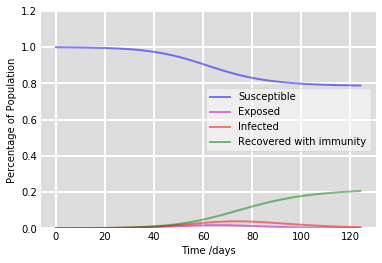

20.13


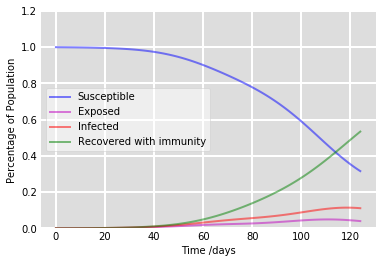

52.96


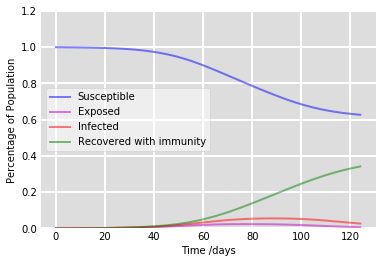

33.72


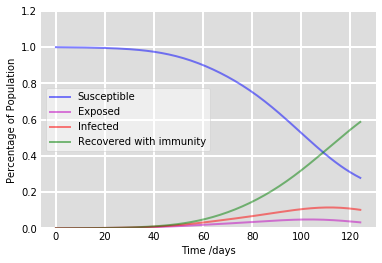

58.3


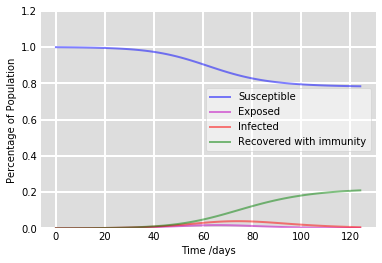

20.52


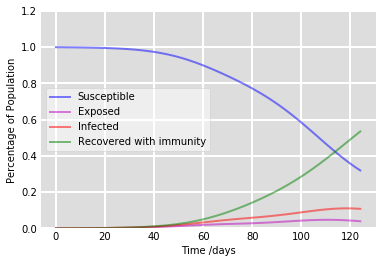

53.04


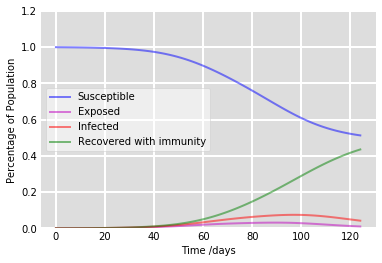

43.1


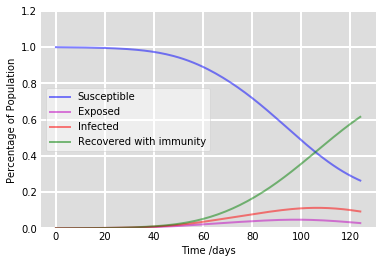

61.09


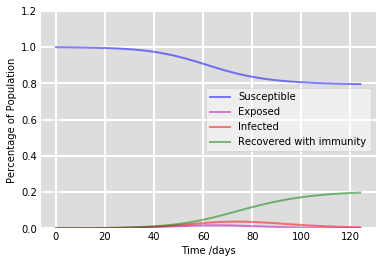

19.34


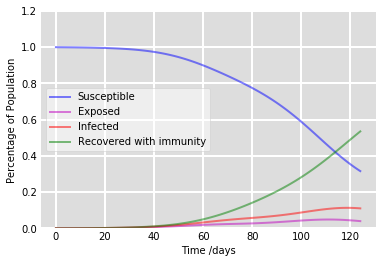

53.07


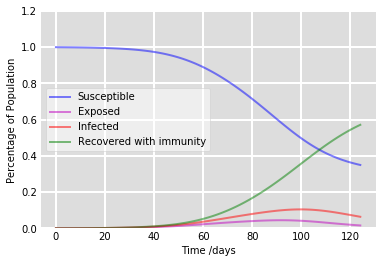

56.69


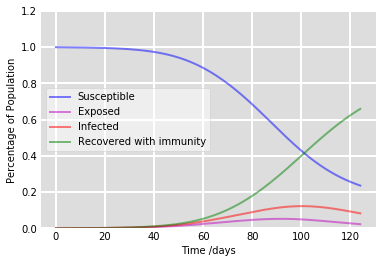

65.5


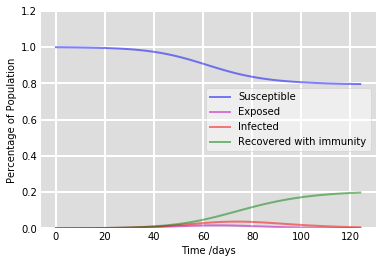

19.34


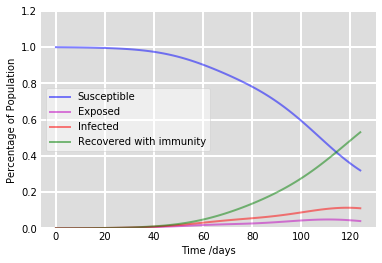

52.6


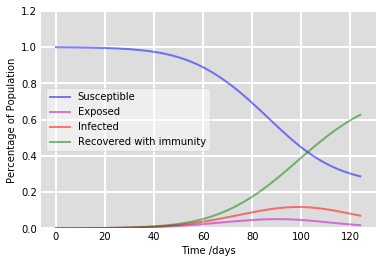

62.23


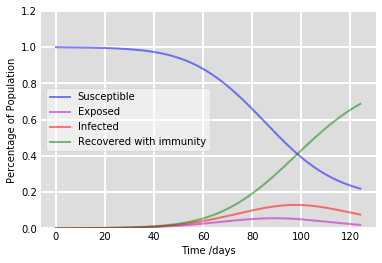

68.24


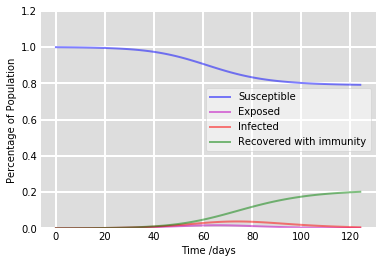

19.73


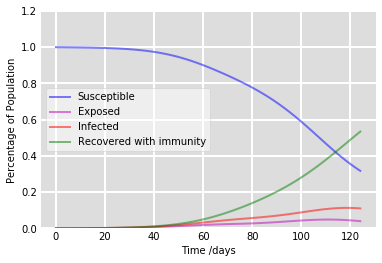

52.96


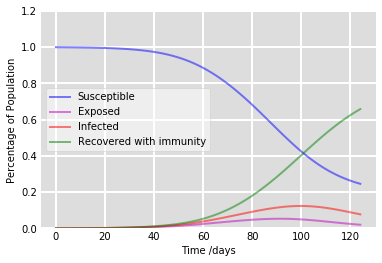

65.37


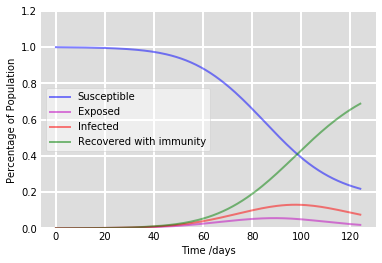

68.36


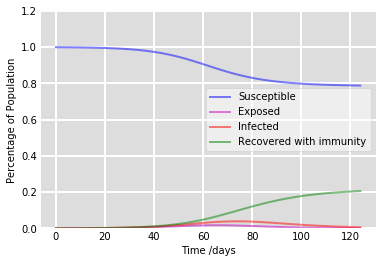

20.12


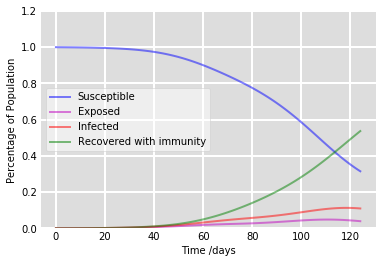

53.25


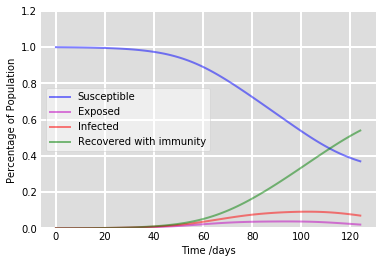

53.56


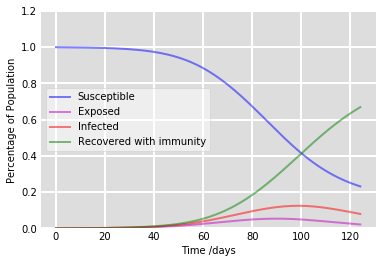

66.43


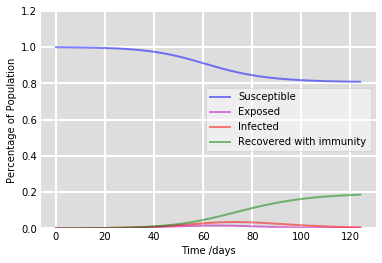

18.15


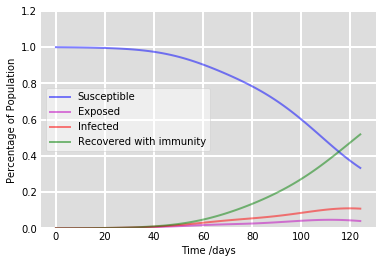

51.42


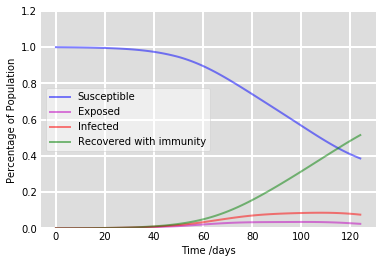

51.04


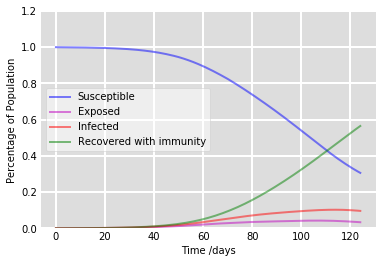

56.04


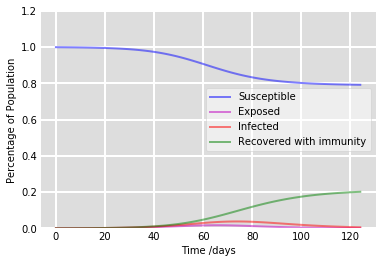

19.73


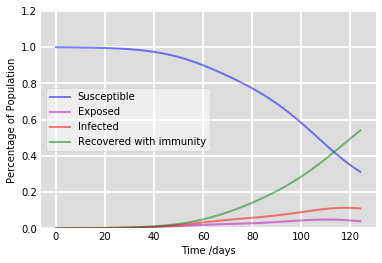

53.61


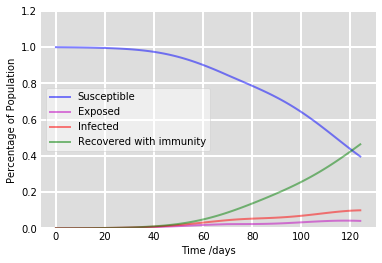

45.94


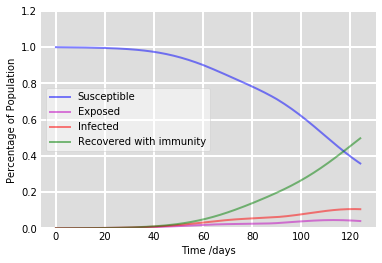

49.27


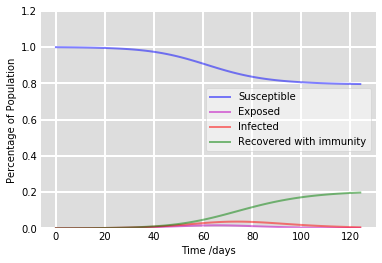

19.33


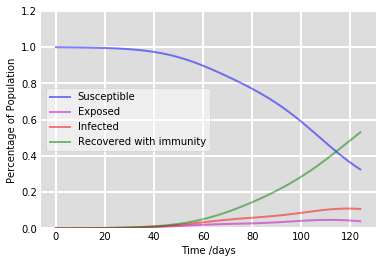

52.54


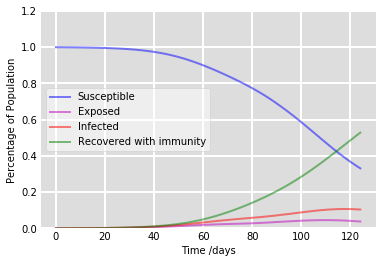

52.38


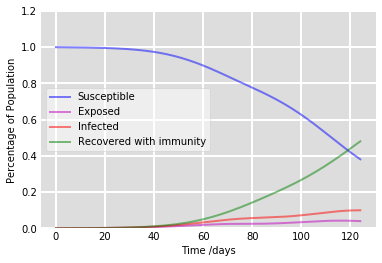

47.59


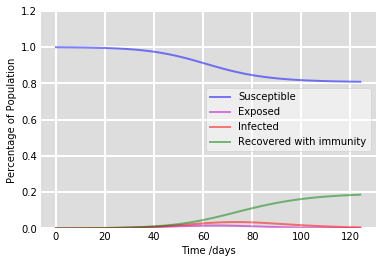

18.14


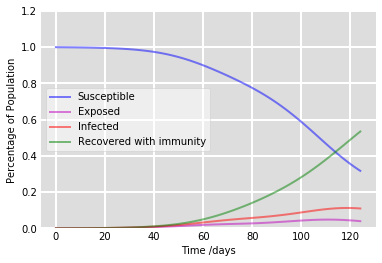

53.0


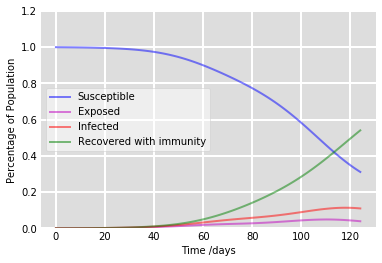

53.63


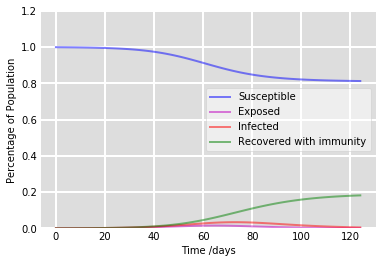

17.75


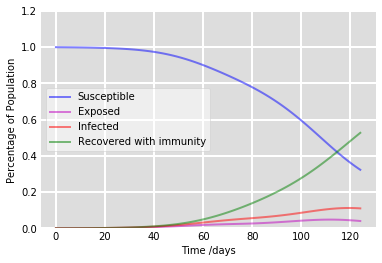

52.27


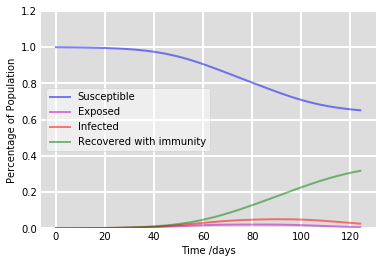

31.31


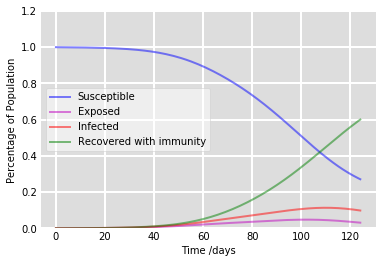

59.6


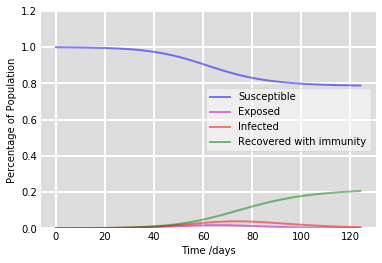

20.13


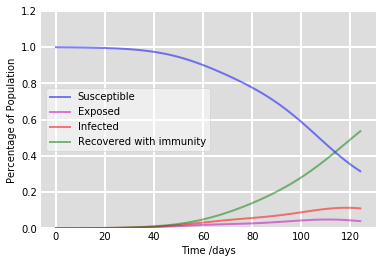

53.15


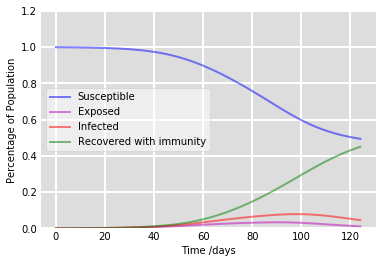

44.59


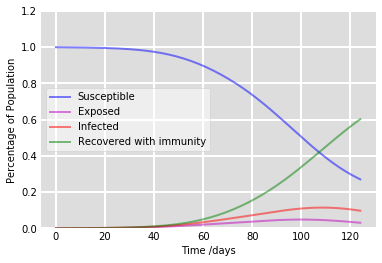

59.82


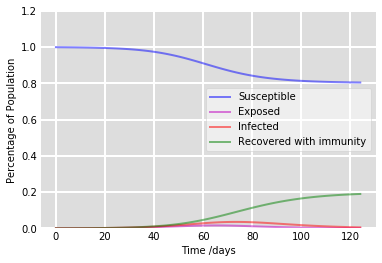

18.54


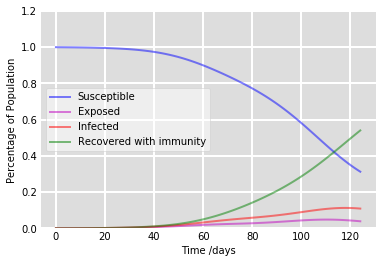

53.59


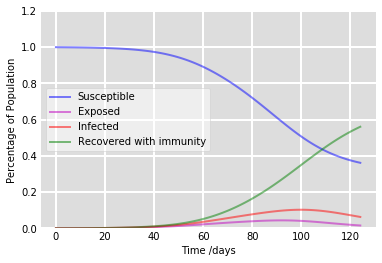

55.62


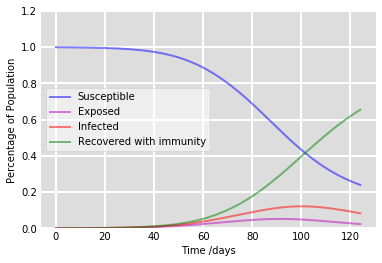

65.01


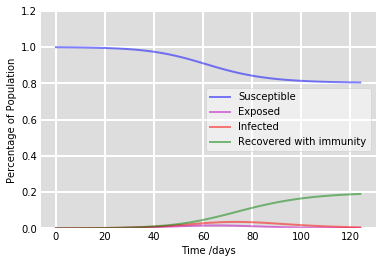

18.54


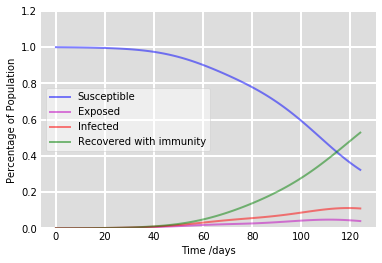

52.4


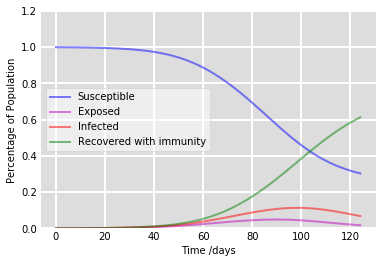

60.83


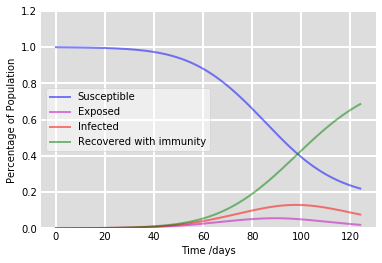

68.16


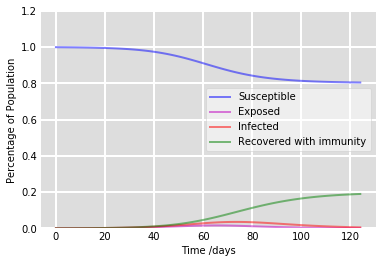

18.54


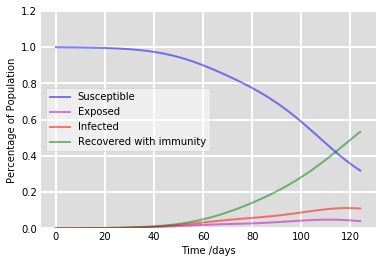

52.89


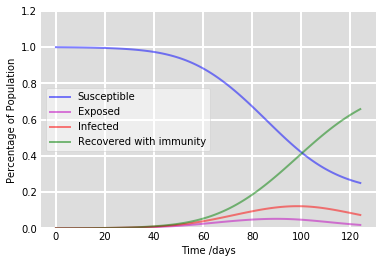

65.37


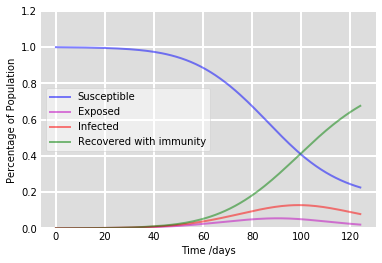

67.16


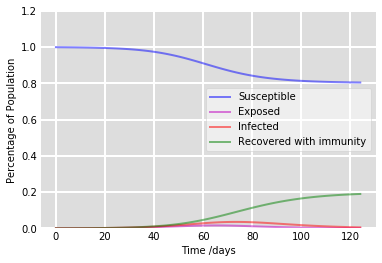

18.54


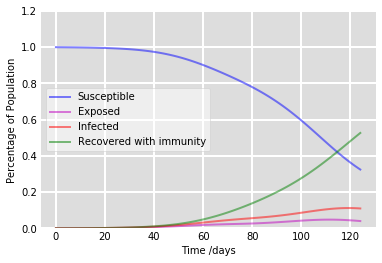

52.2


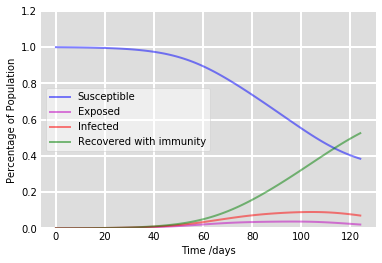

52.09


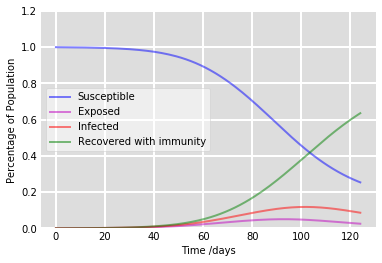

63.11


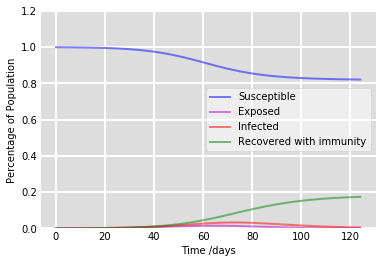

16.96


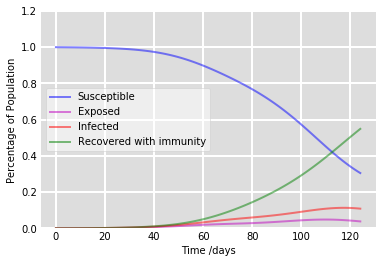

54.45


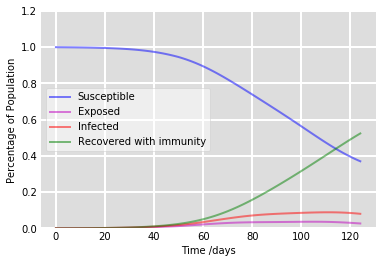

51.93


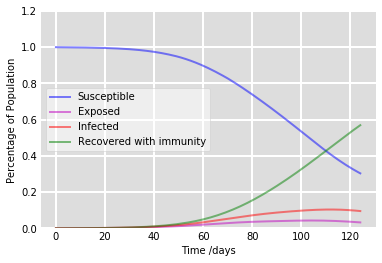

56.49


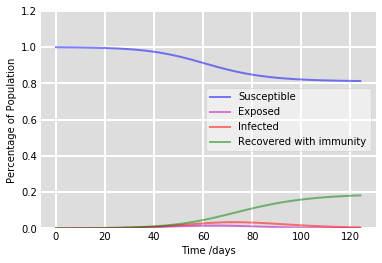

17.76


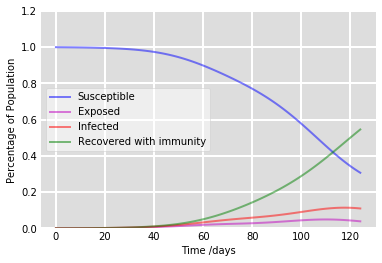

54.13


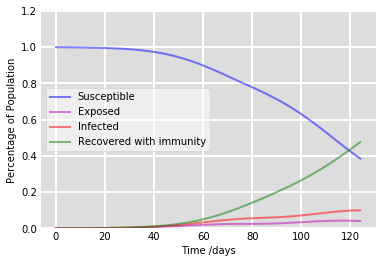

47.17


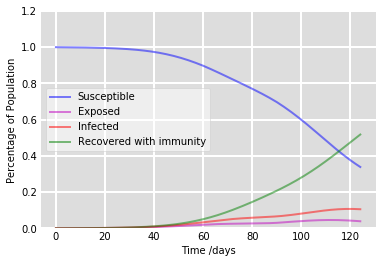

51.34


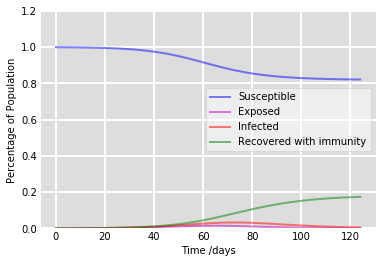

16.96


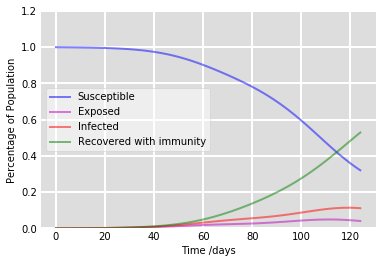

52.46


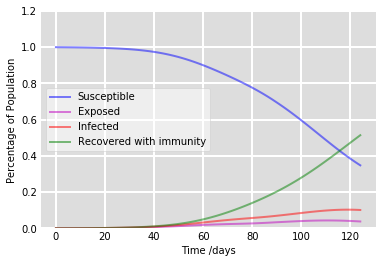

50.96


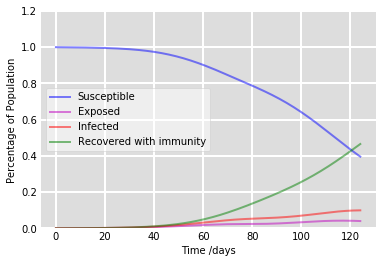

46.11


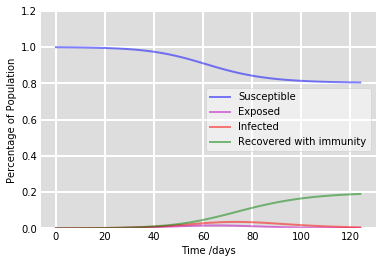

18.54


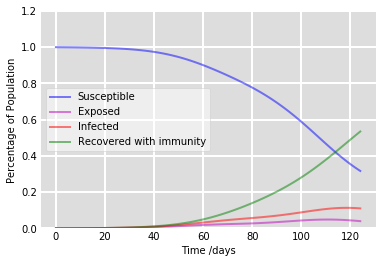

53.02


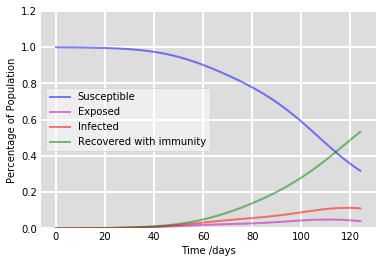

52.88


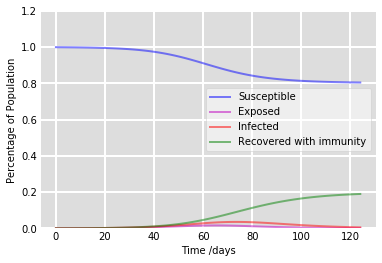

18.54


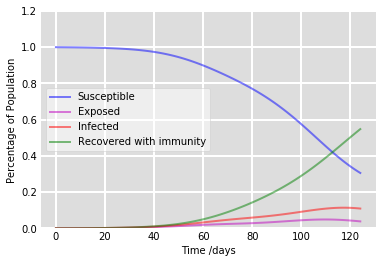

54.33


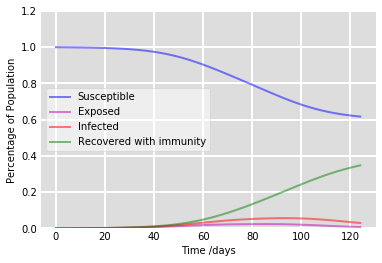

34.31


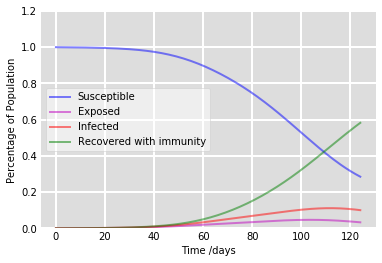

57.8


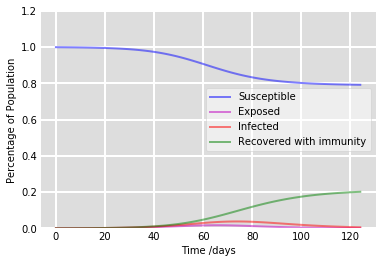

19.73


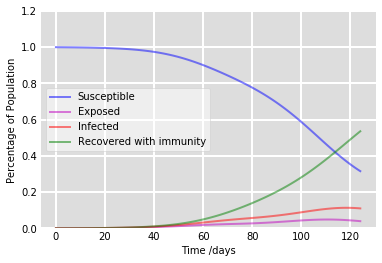

53.14


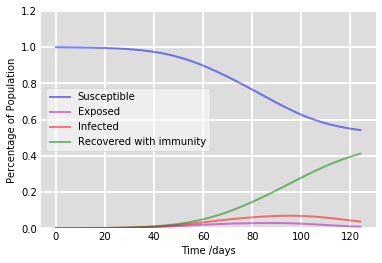

40.72


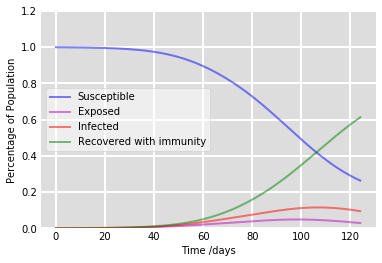

60.88


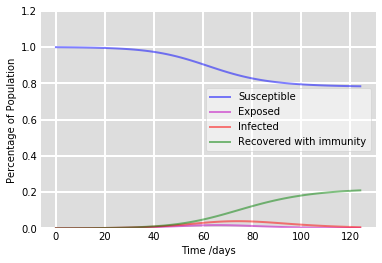

20.52


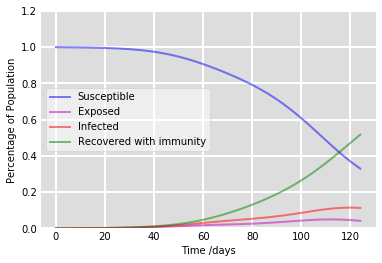

51.29


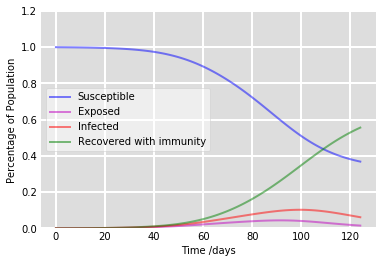

55.16


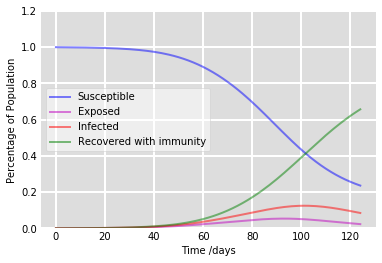

65.25


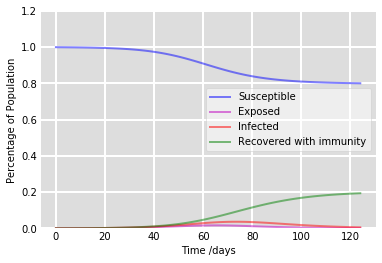

18.94


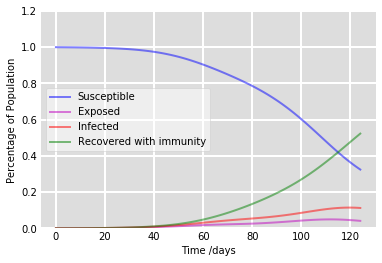

51.84


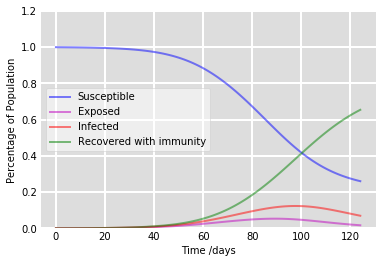

64.97


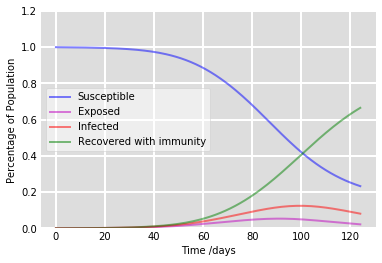

66.07


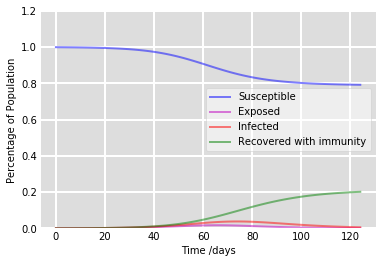

19.73


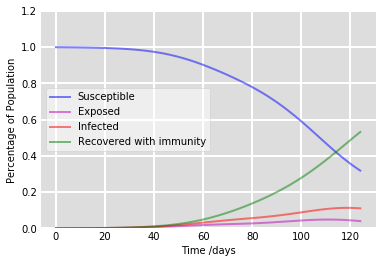

52.78


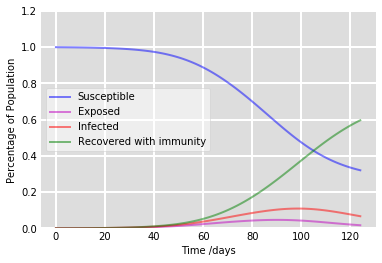

59.21


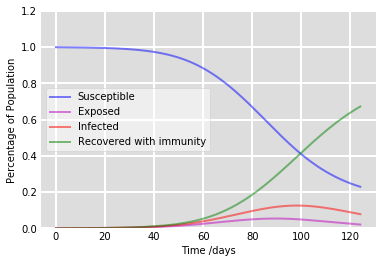

66.79


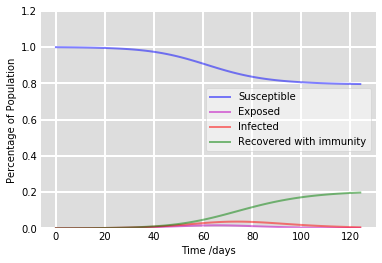

19.33


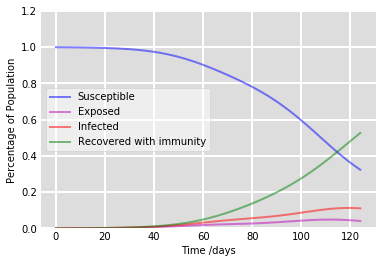

52.22


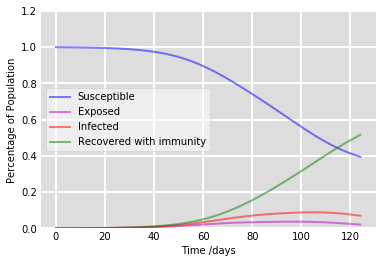

51.14


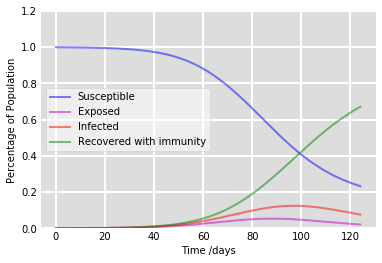

66.69


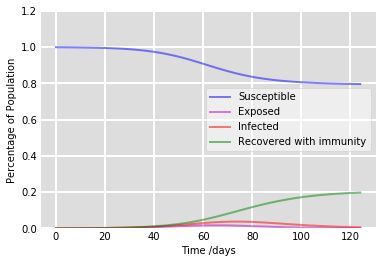

19.34


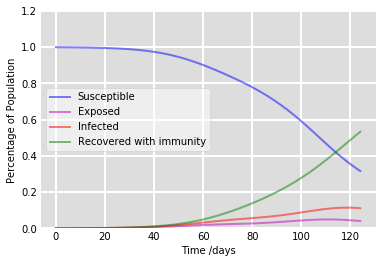

52.89


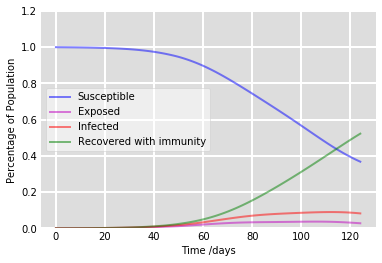

51.82


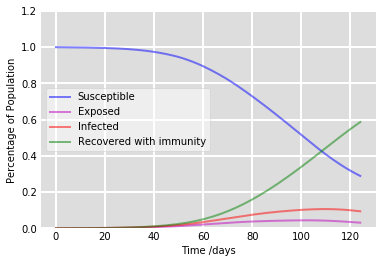

58.24


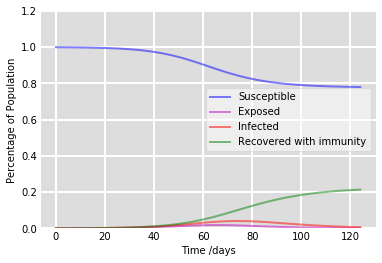

20.91


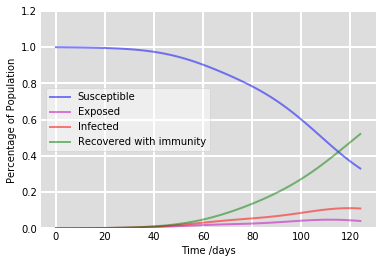

51.62


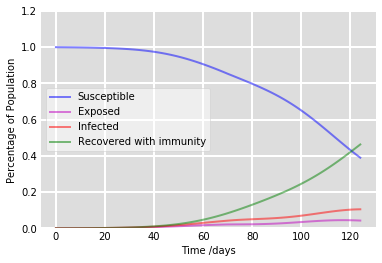

45.86


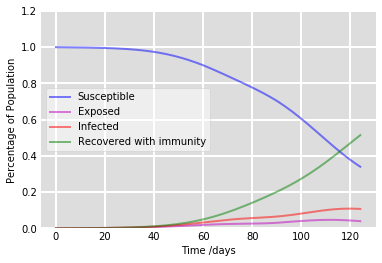

51.0


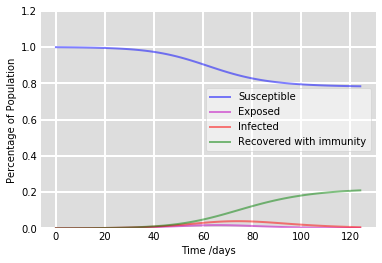

20.52


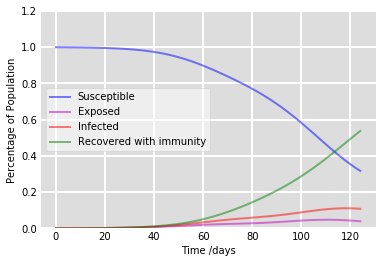

53.31


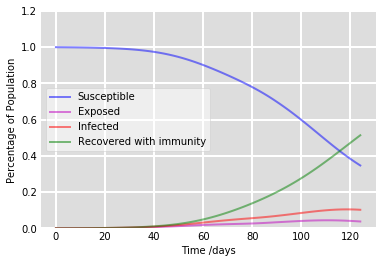

50.93


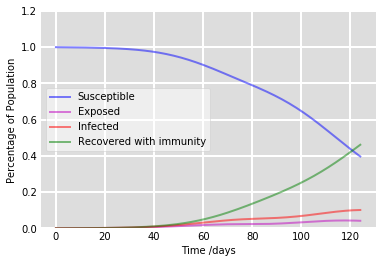

45.69


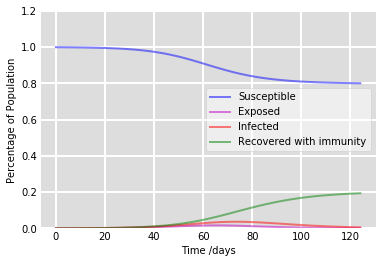

18.94


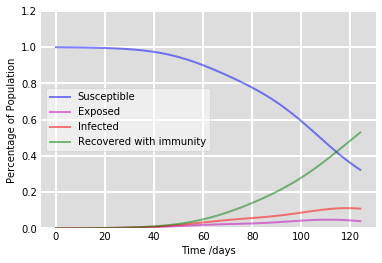

52.52


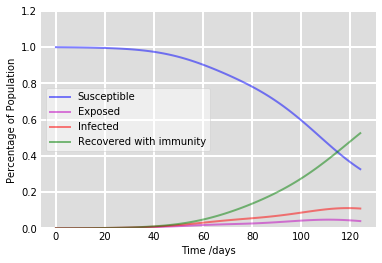

52.08


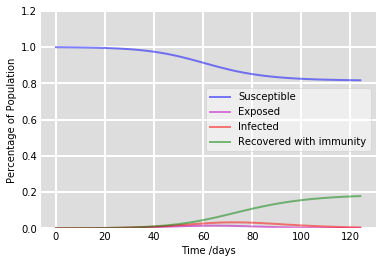

17.36


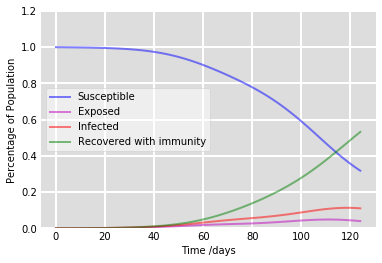

52.79


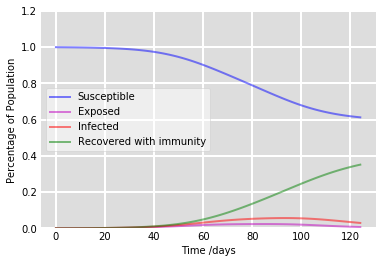

34.71


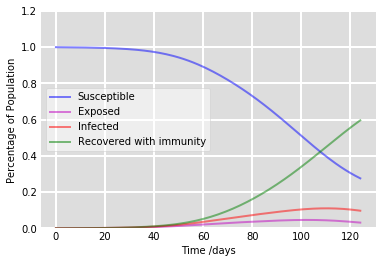

59.17


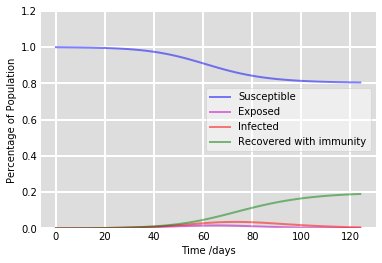

18.55


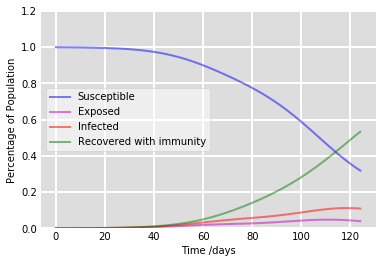

52.91


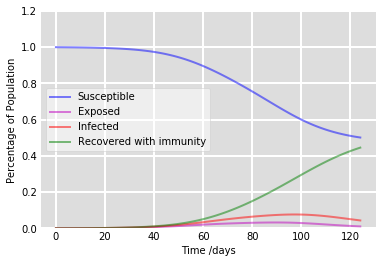

44.11


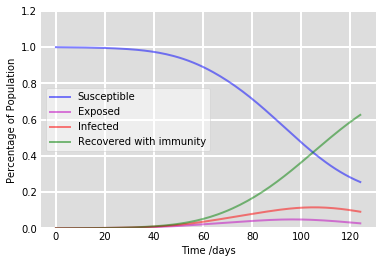

62.17


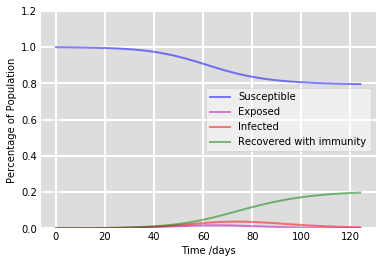

19.34


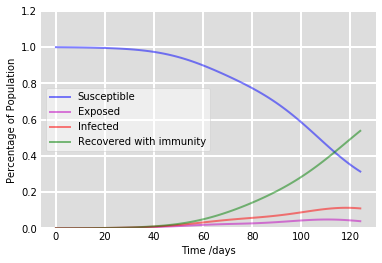

53.36


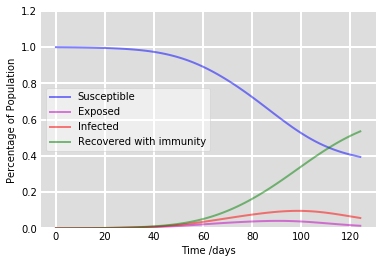

53.09


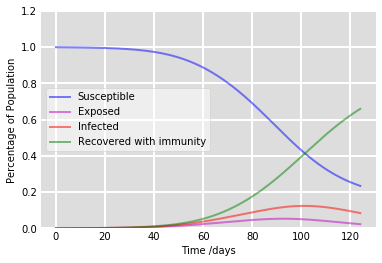

65.51


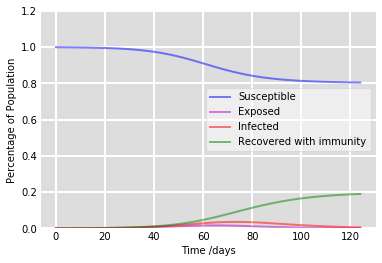

18.55


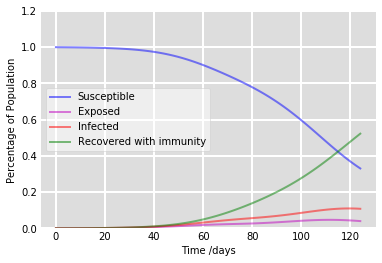

51.81


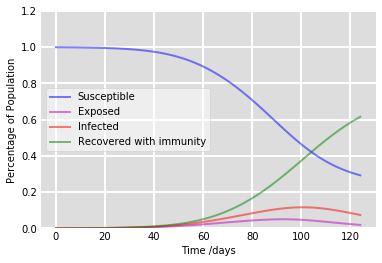

61.11


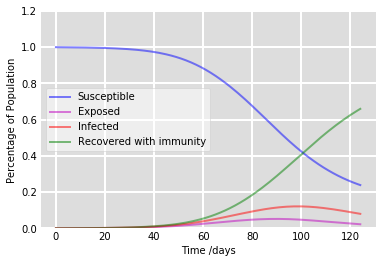

65.51


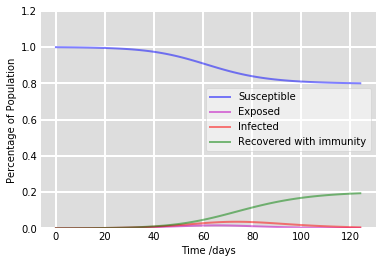

18.94


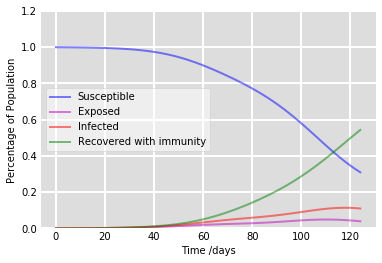

53.86


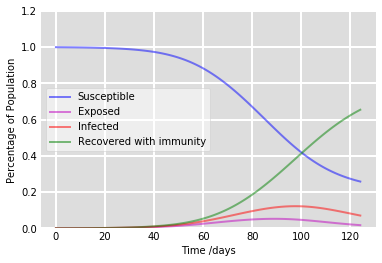

65.01


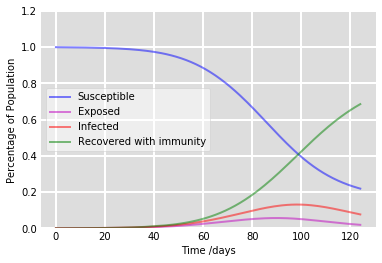

68.12


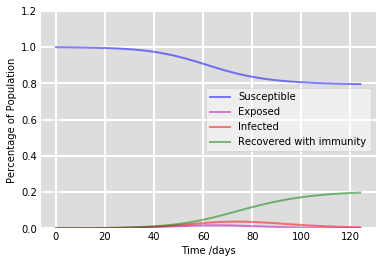

19.34


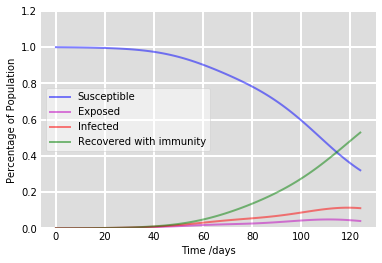

52.43


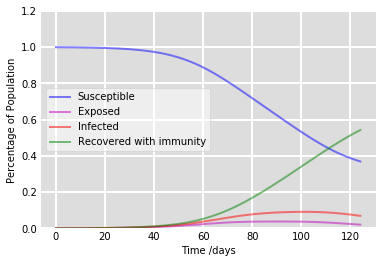

53.81


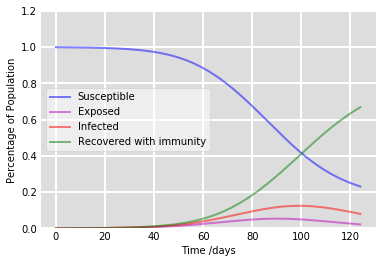

66.4


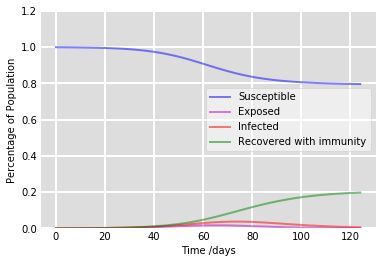

19.34


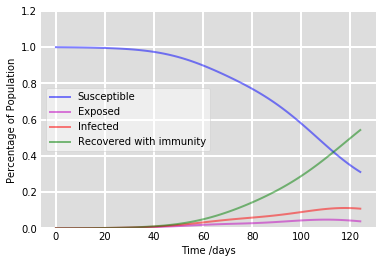

53.82


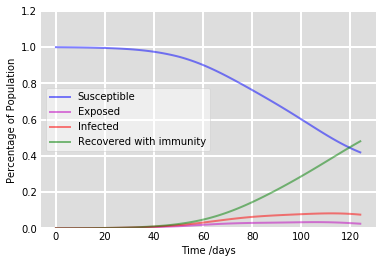

47.62


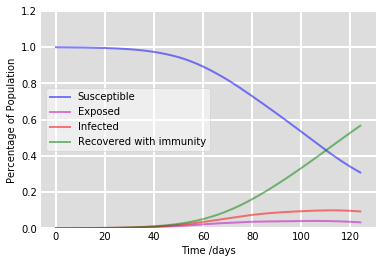

56.2


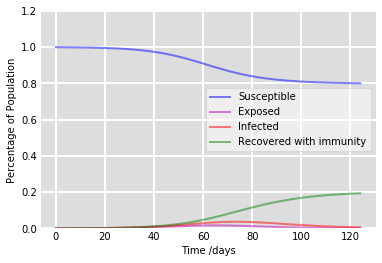

18.94


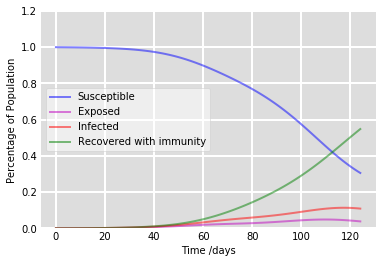

54.36


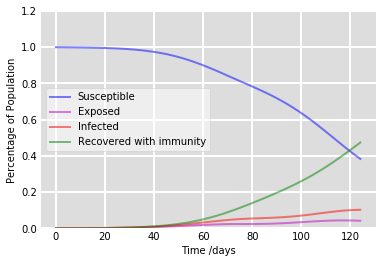

46.94


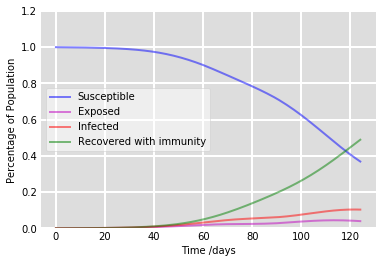

48.46


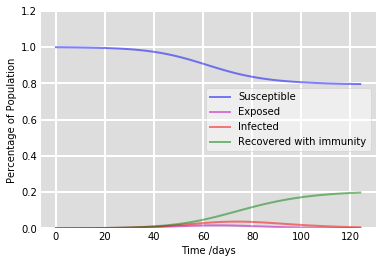

19.34


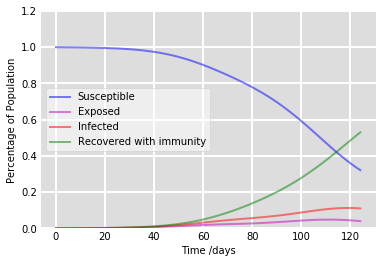

52.56


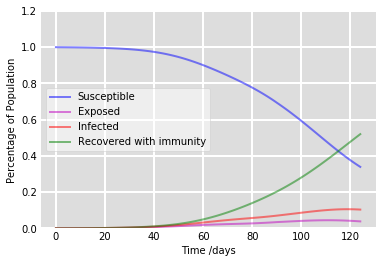

51.55


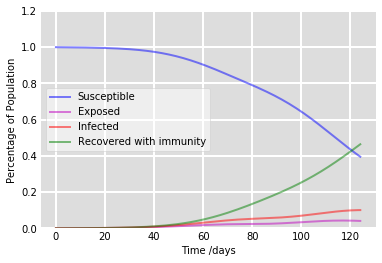

45.97


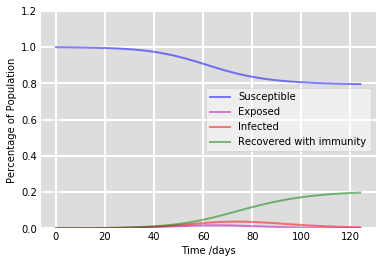

19.34


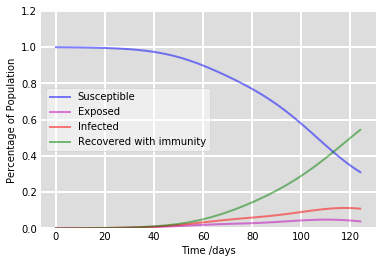

53.93


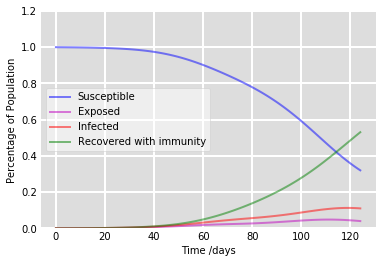

52.62


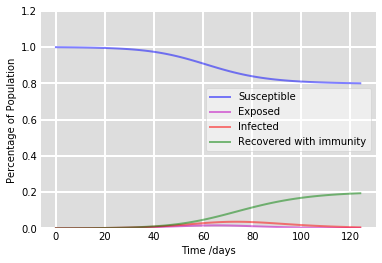

18.94


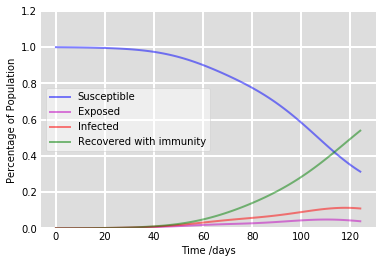

53.48


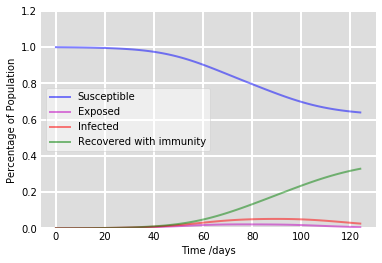

32.44


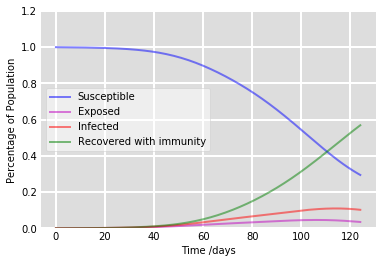

56.46


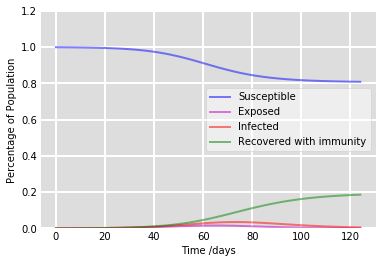

18.15


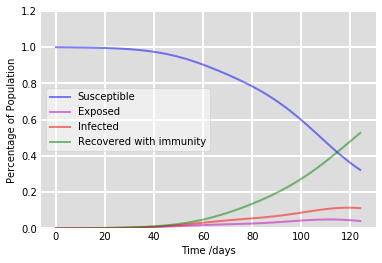

52.21


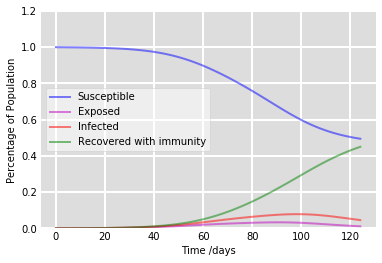

44.55


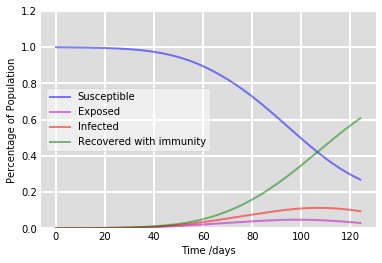

60.31


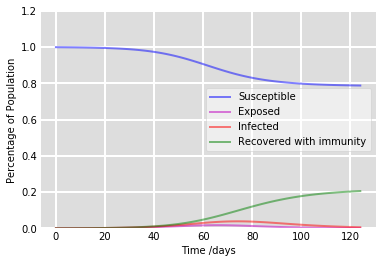

20.12


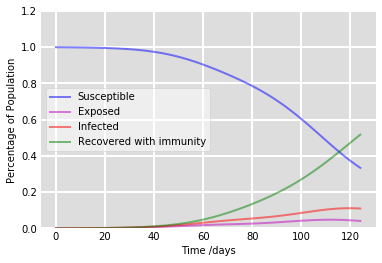

51.28


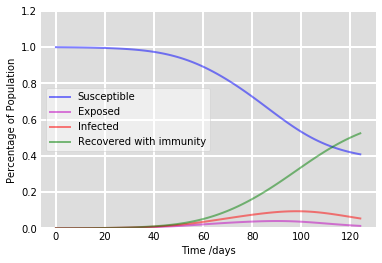

52.02


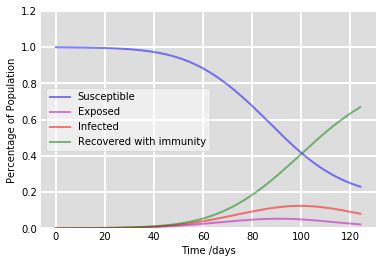

66.44


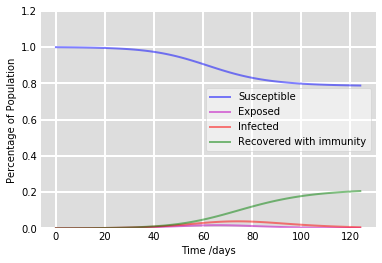

20.12


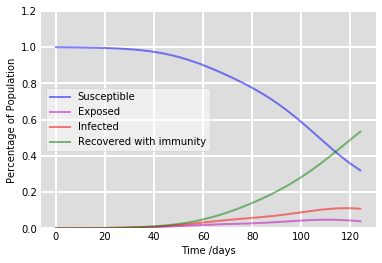

52.91


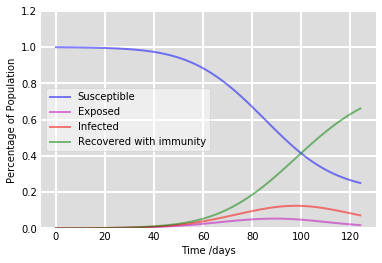

65.69


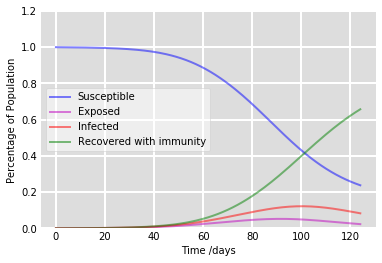

65.28


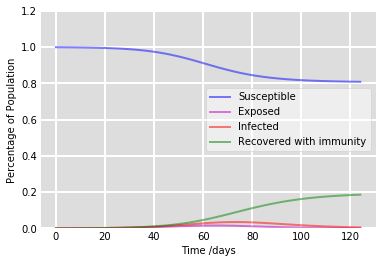

18.15


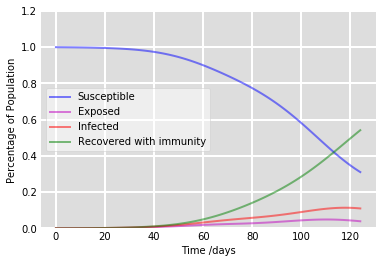

53.72


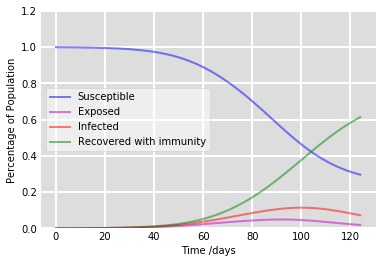

60.94


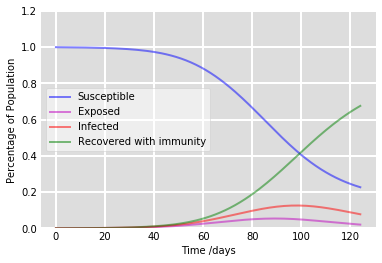

67.14


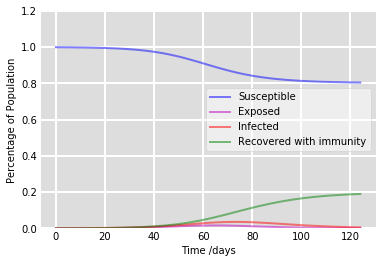

18.55


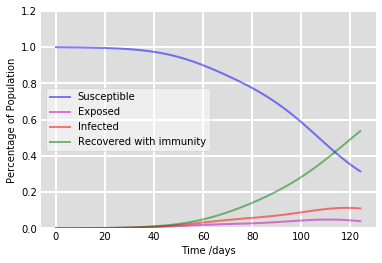

53.24


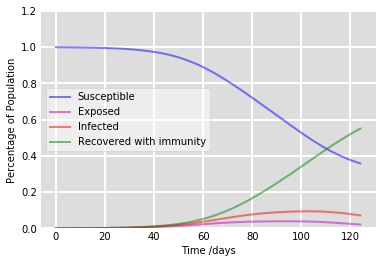

54.58


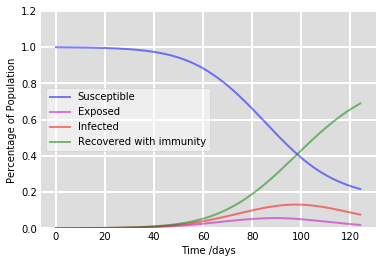

68.51


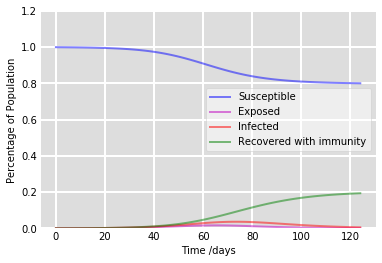

18.94


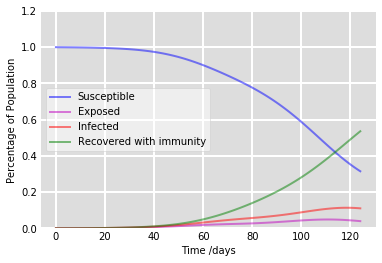

53.14


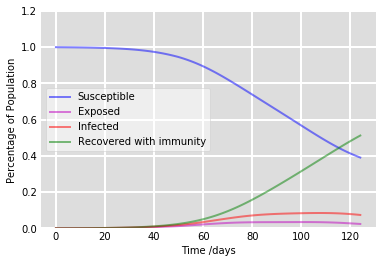

50.79


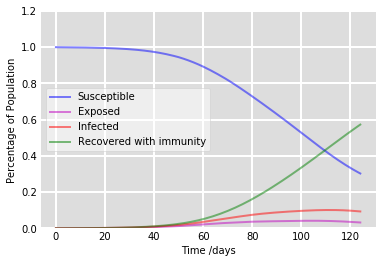

56.82


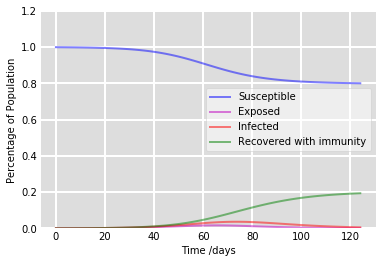

18.94


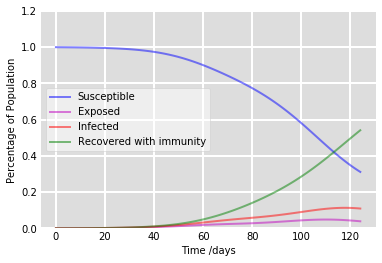

53.69


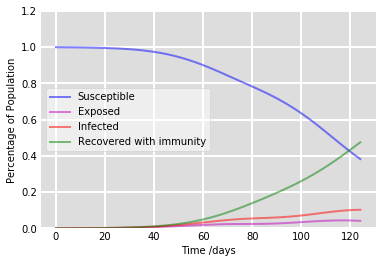

47.07


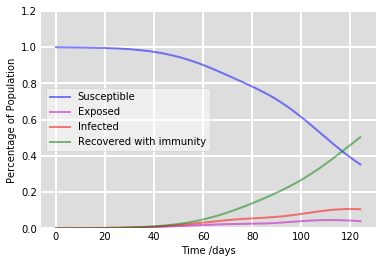

49.86


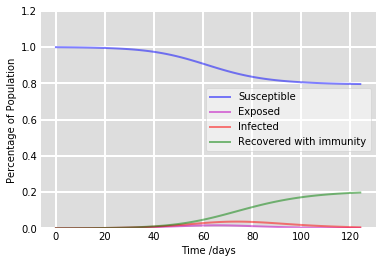

19.34


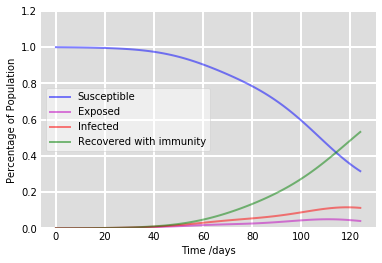

52.76


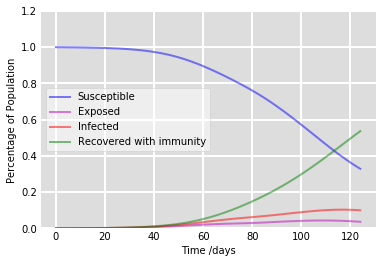

53.21


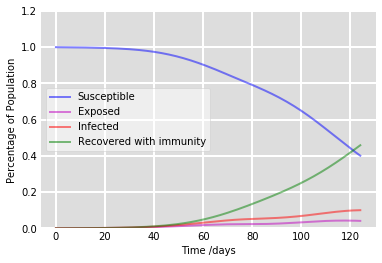

45.42


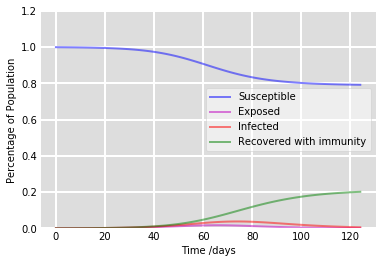

19.73


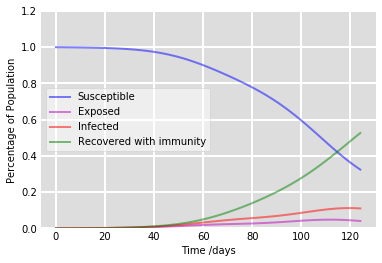

52.19


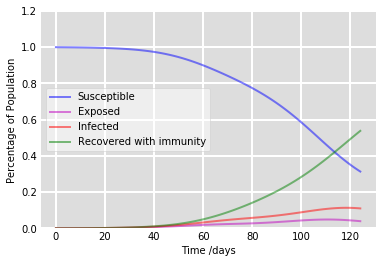

53.36


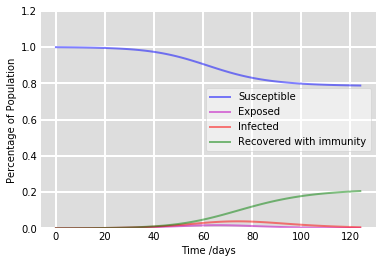

20.12


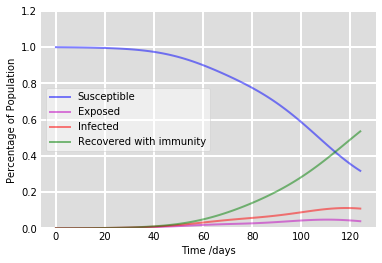

53.09


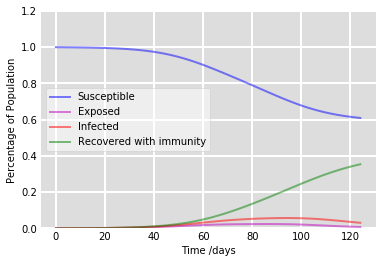

34.93


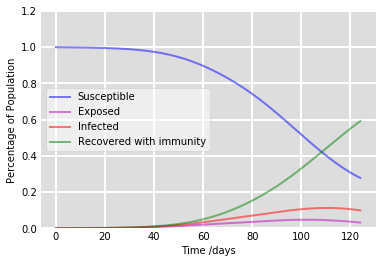

58.73


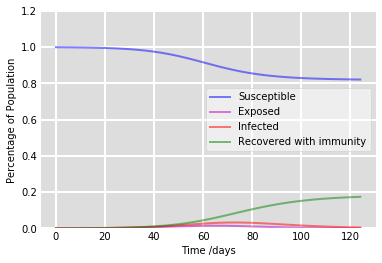

16.95


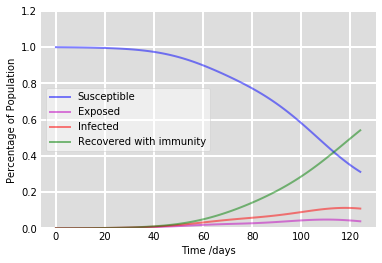

53.68


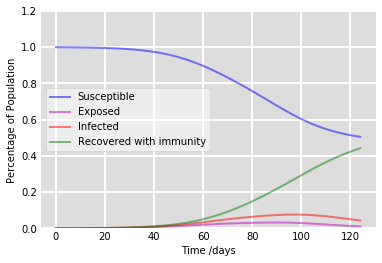

43.76


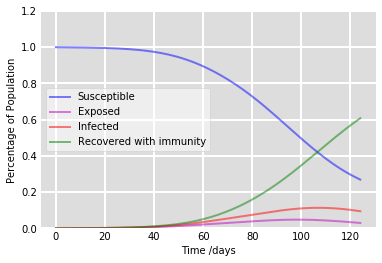

60.33


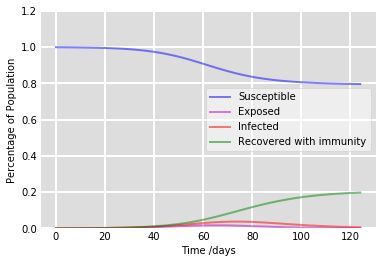

19.34


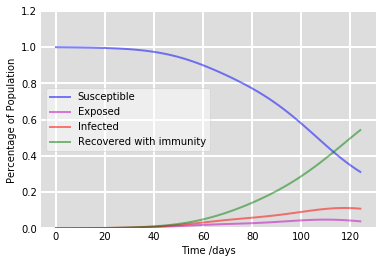

53.79


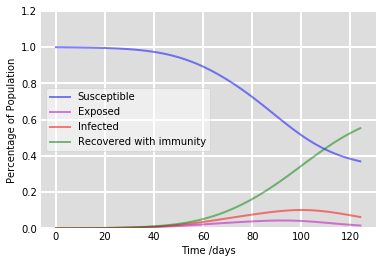

54.84


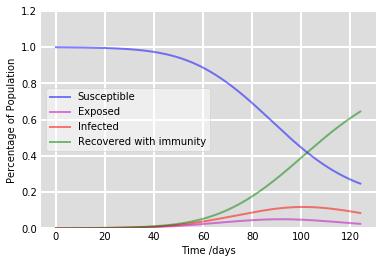

64.04


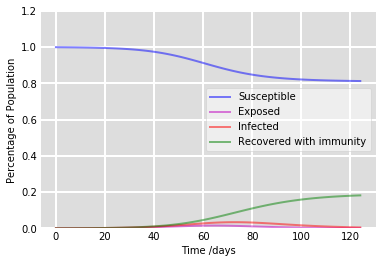

17.76


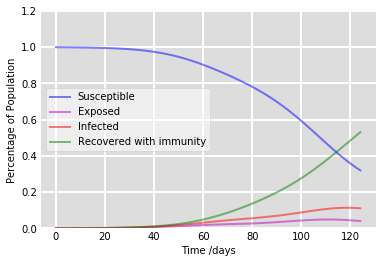

52.6


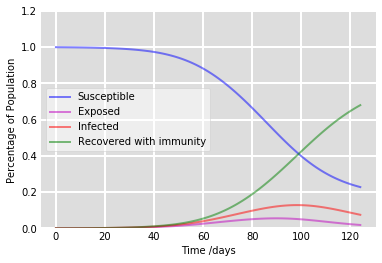

67.54


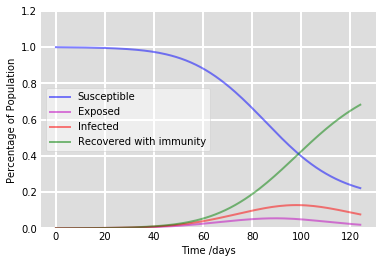

67.79


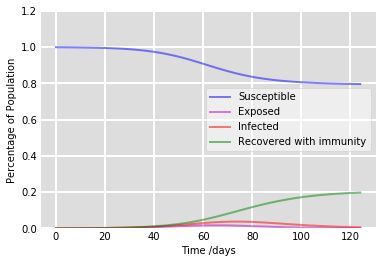

19.34


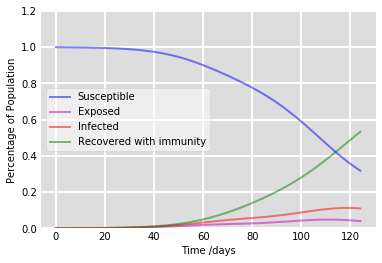

52.87


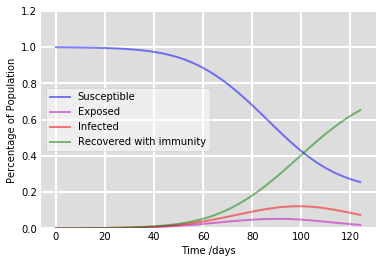

64.8


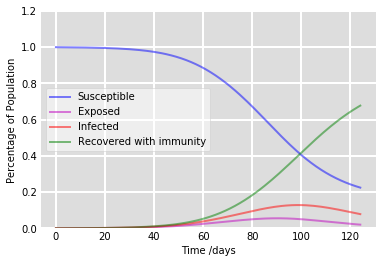

67.29


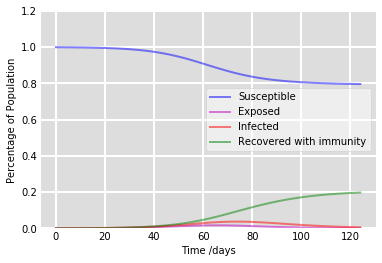

19.33


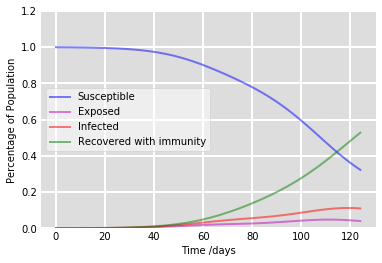

52.35


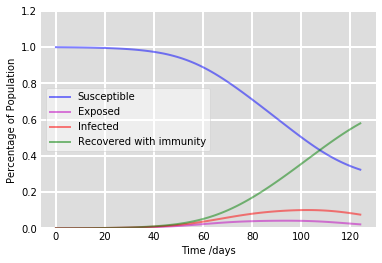

57.51


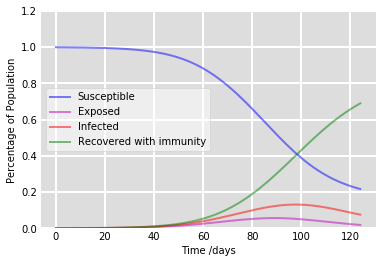

68.55


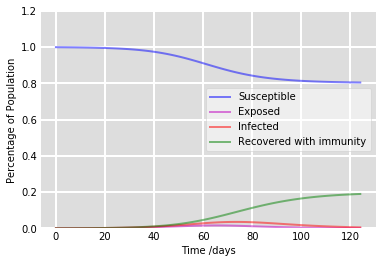

18.54


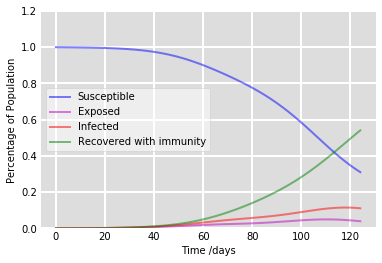

53.62


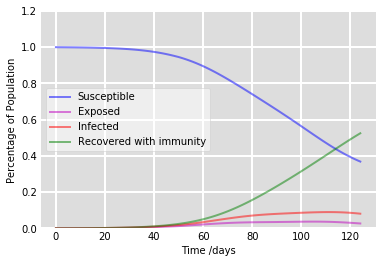

52.03


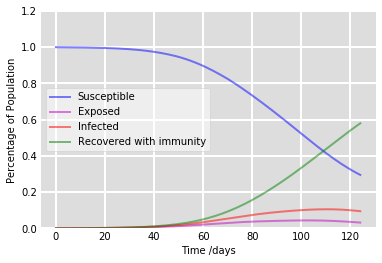

57.53


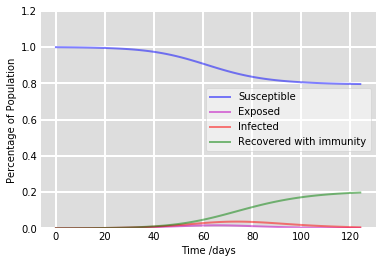

19.34


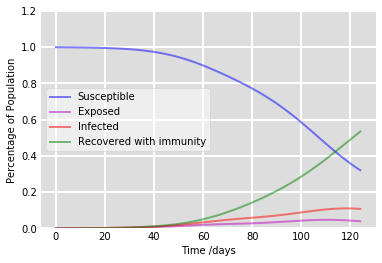

52.96


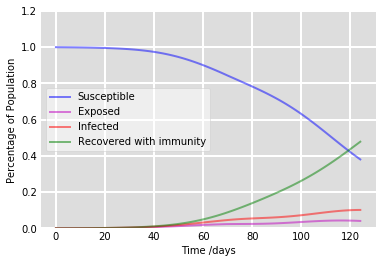

47.37


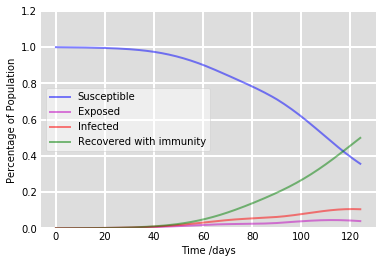

49.48


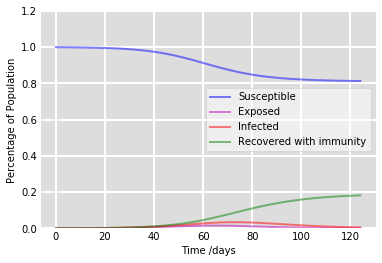

17.76


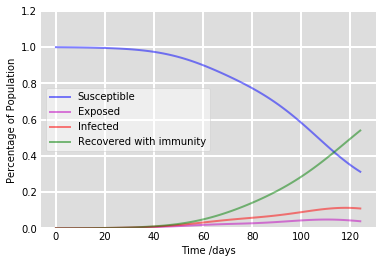

53.56


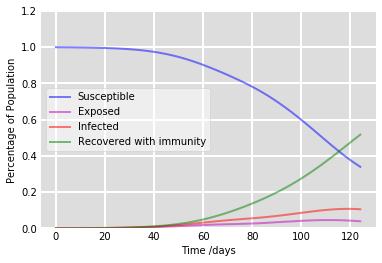

51.27


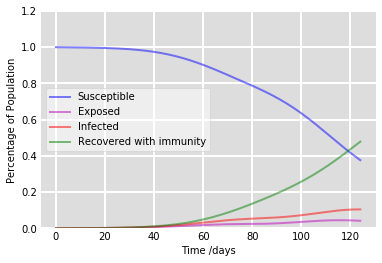

47.4


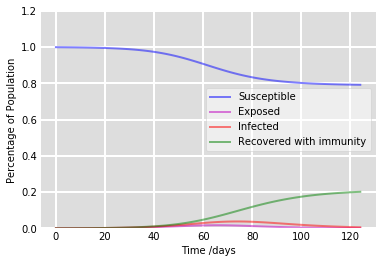

19.73


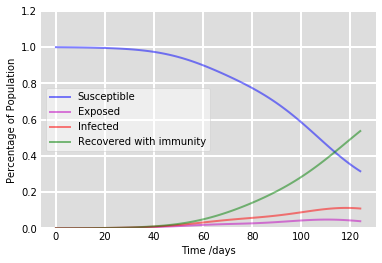

53.26


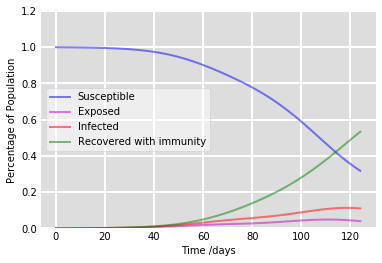

52.91


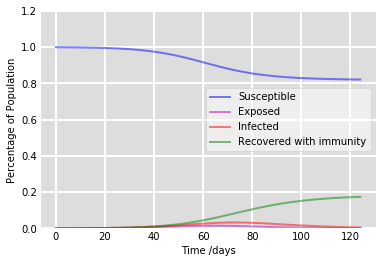

16.95


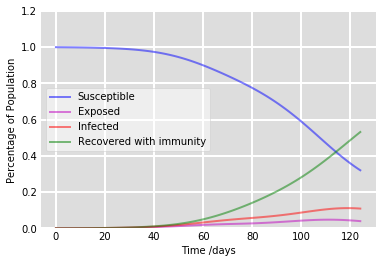

52.73


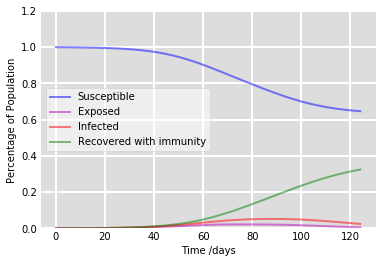

31.99


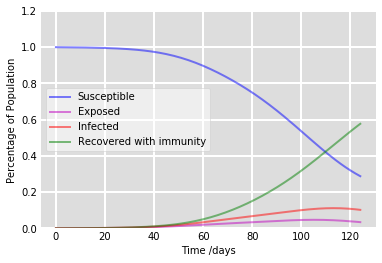

57.26


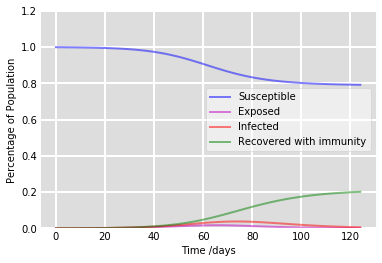

19.73


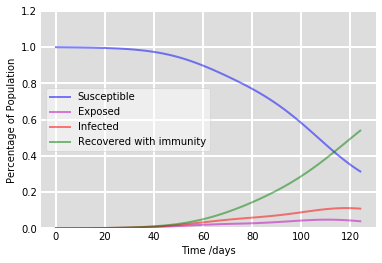

53.51


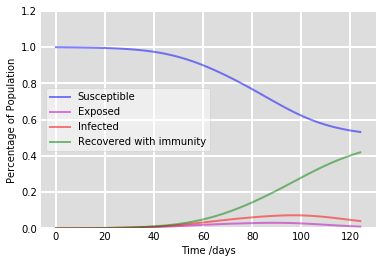

41.51


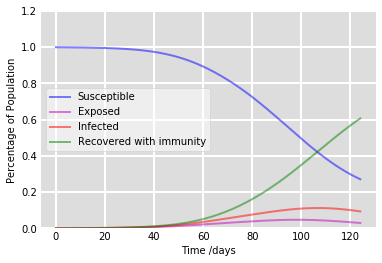

60.26


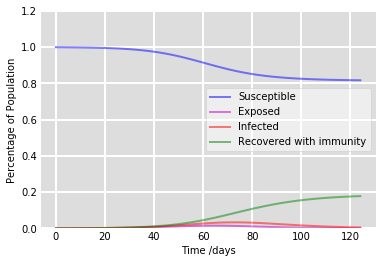

17.36


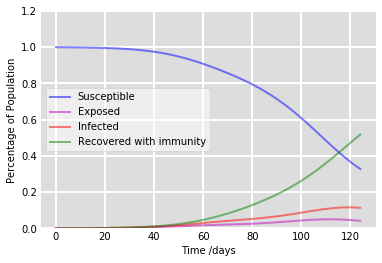

51.4


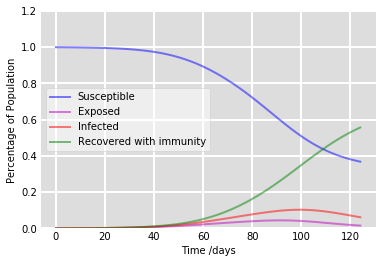

55.22


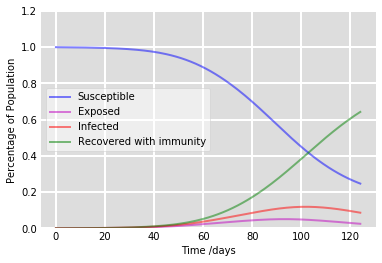

63.82


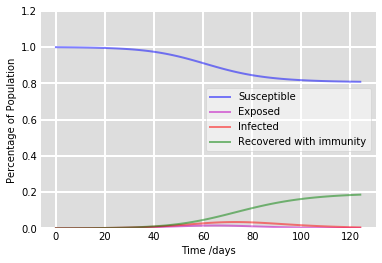

18.15


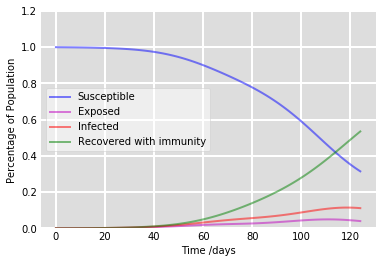

53.04


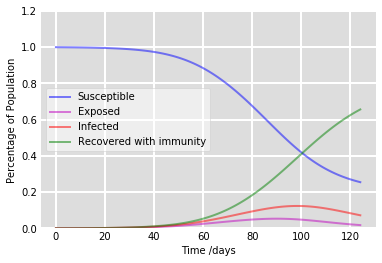

65.18


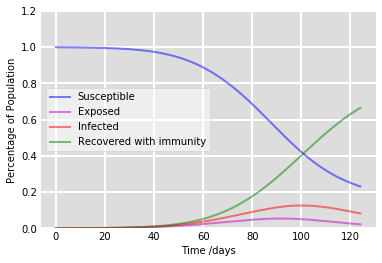

66.1


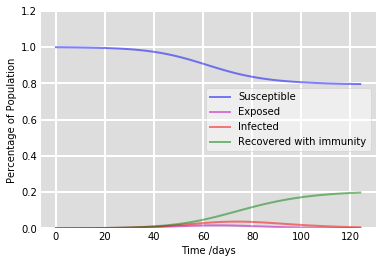

19.34


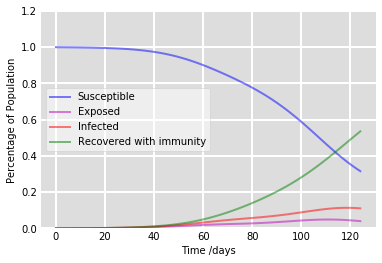

53.08


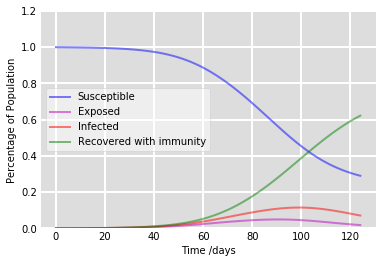

61.75


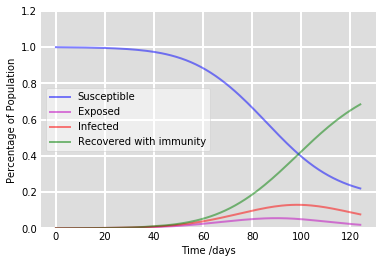

67.98


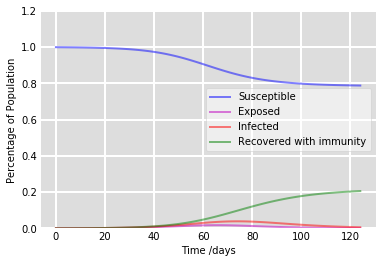

20.12


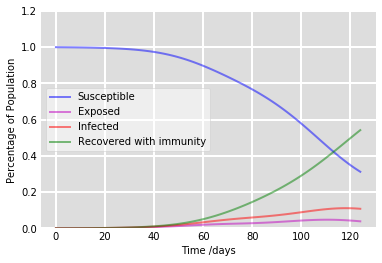

53.76


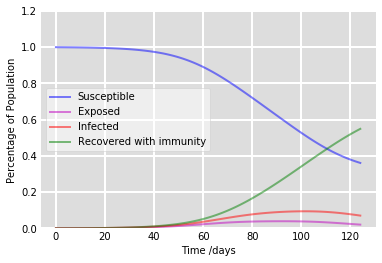

54.47


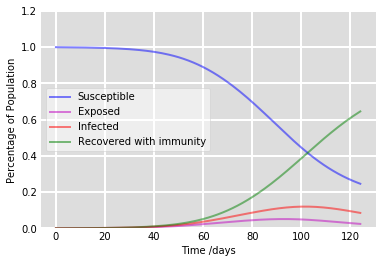

64.09


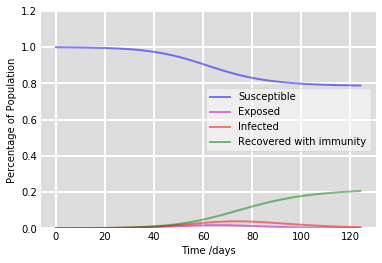

20.13


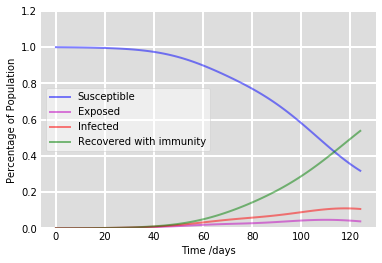

53.35


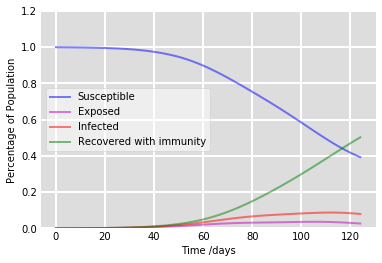

49.8


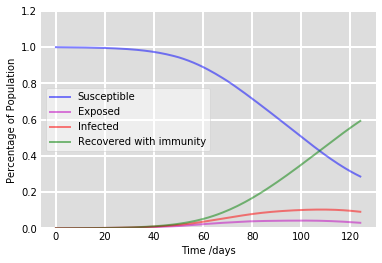

58.85


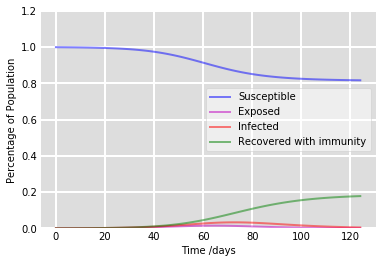

17.36


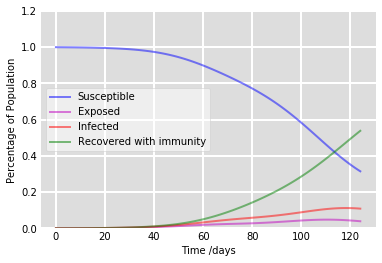

53.39


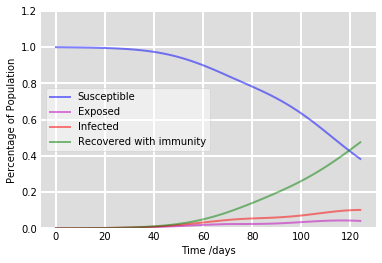

47.07


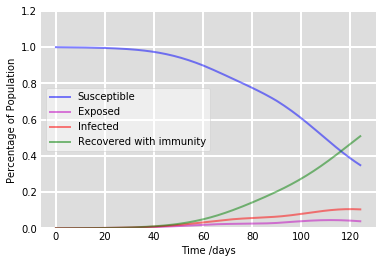

50.41


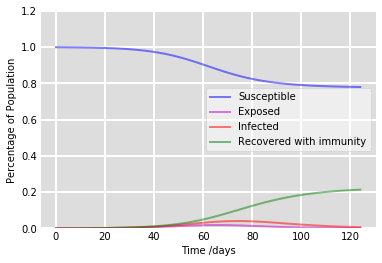

20.91


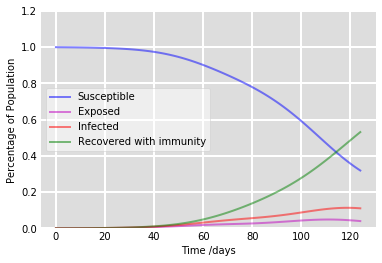

52.68


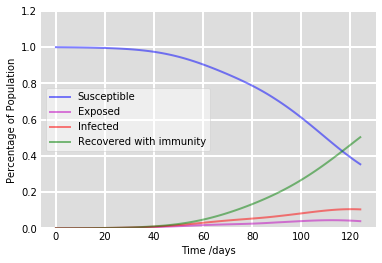

49.87


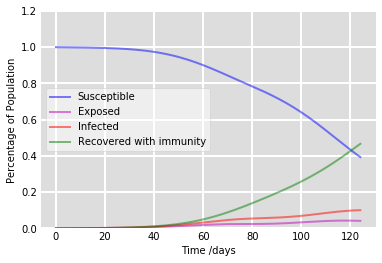

46.2


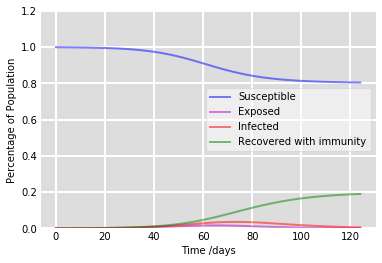

18.55


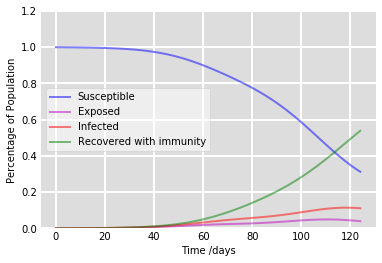

53.42


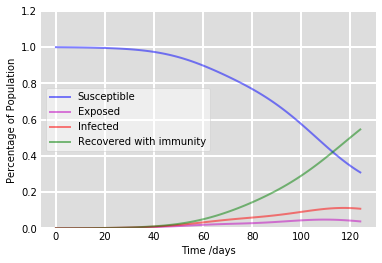

54.15


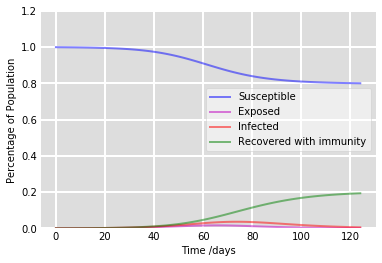

18.93


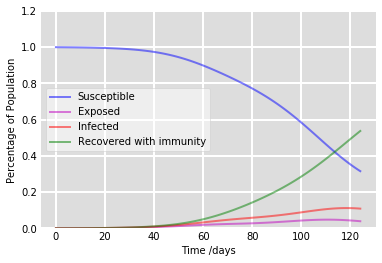

53.3


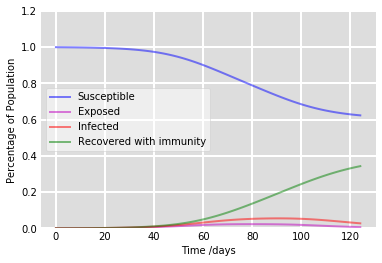

33.88


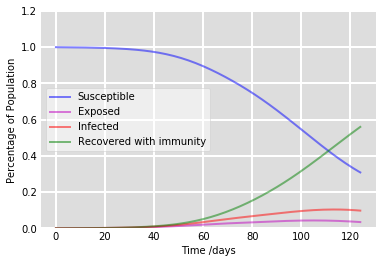

55.54


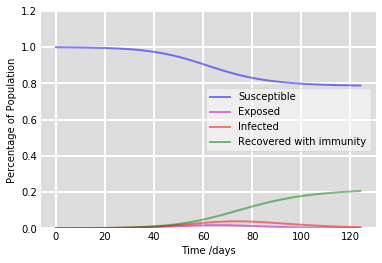

20.13


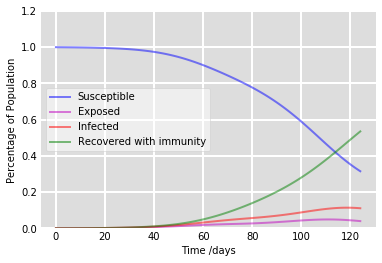

53.06


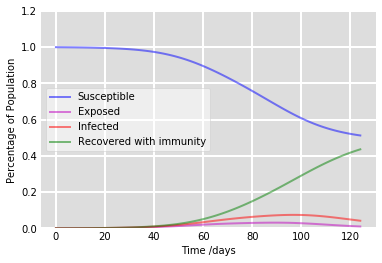

43.17


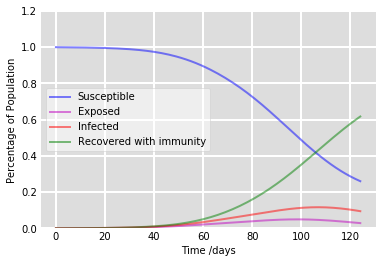

61.29


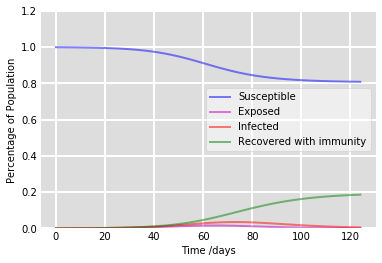

18.15


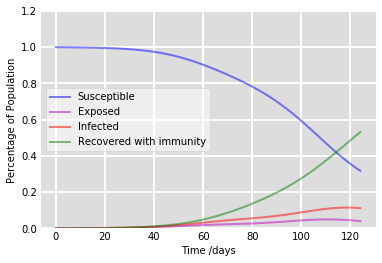

52.72


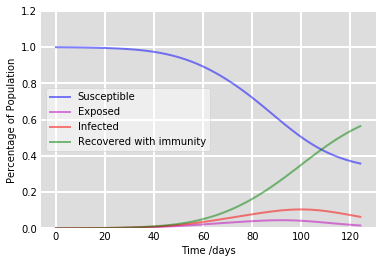

55.97


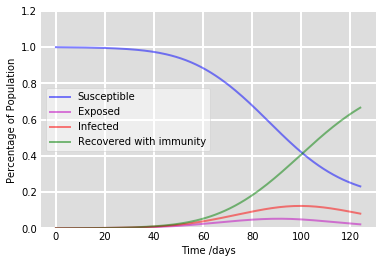

66.16


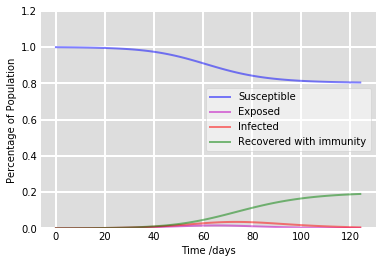

18.54


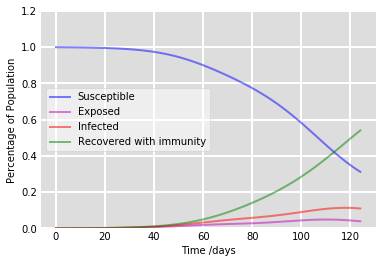

53.6


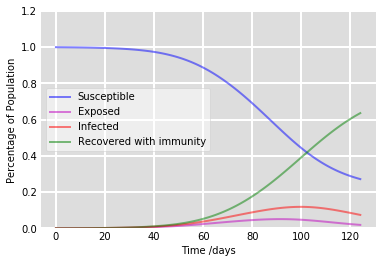

63.16


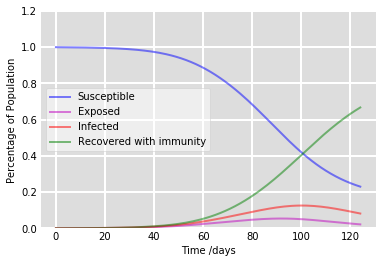

66.27


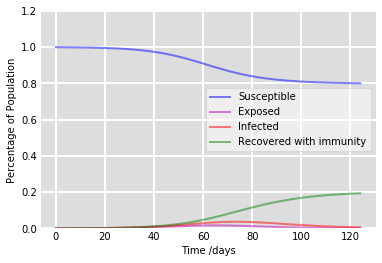

18.94


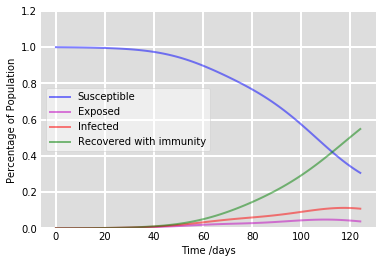

54.39


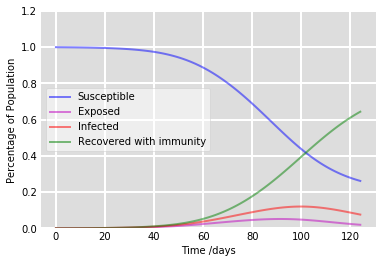

63.93


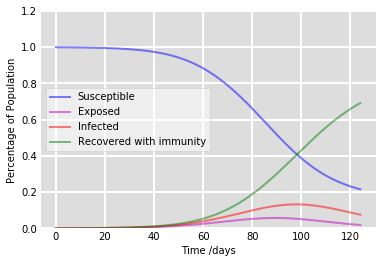

68.7


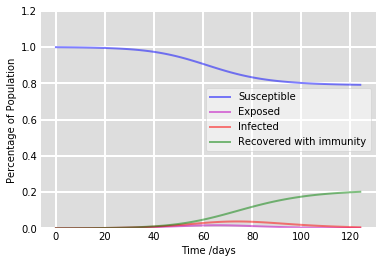

19.73


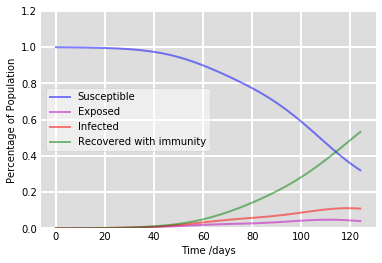

52.75


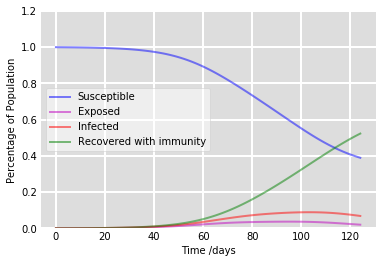

51.87


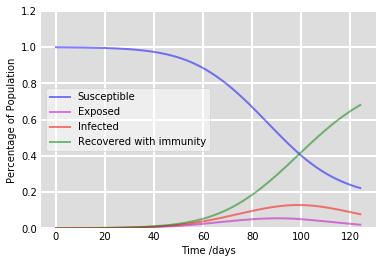

67.64


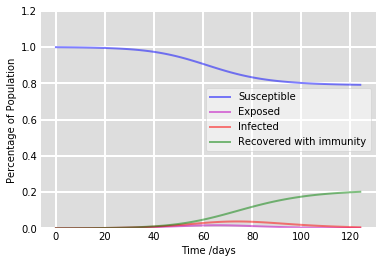

19.73


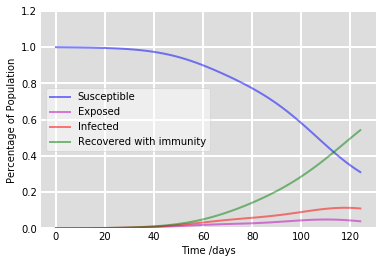

53.75


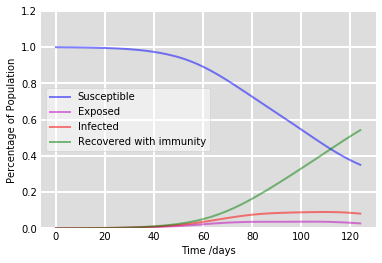

53.76


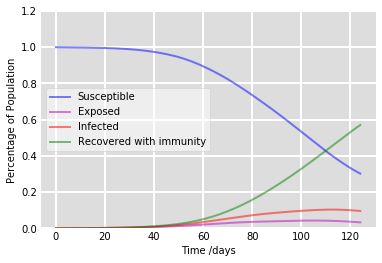

56.62


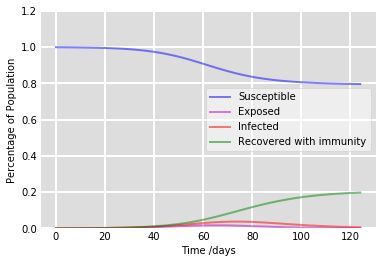

19.34


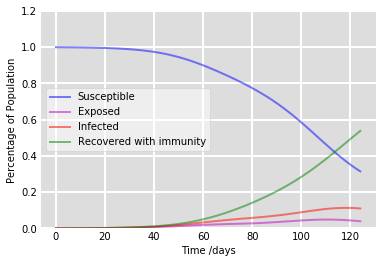

53.34


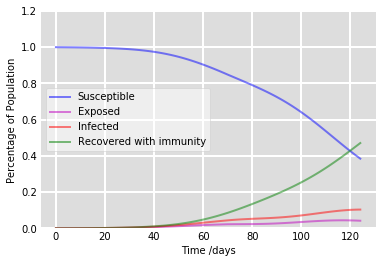

46.64


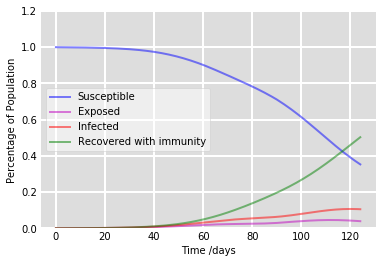

49.86


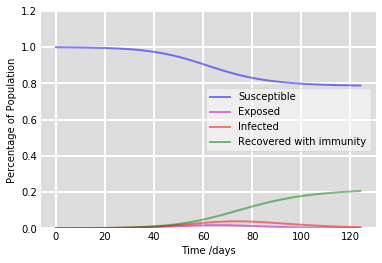

20.13


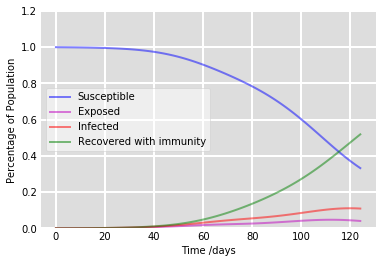

51.43


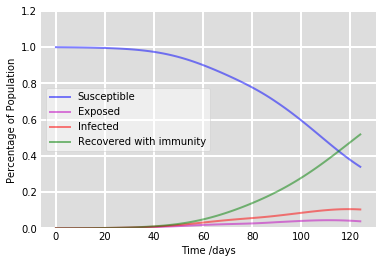

51.39


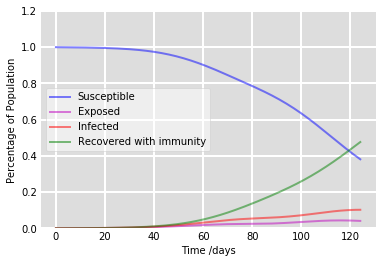

47.19


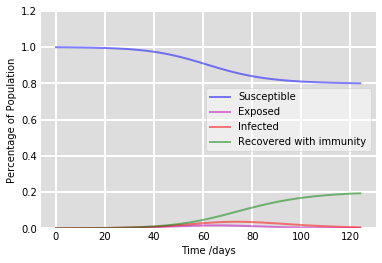

18.93


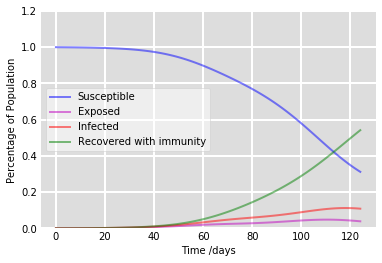

53.73


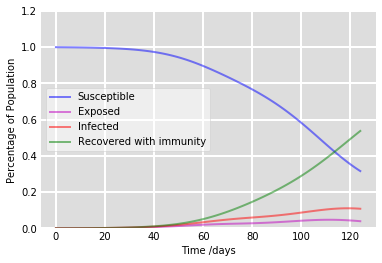

53.3


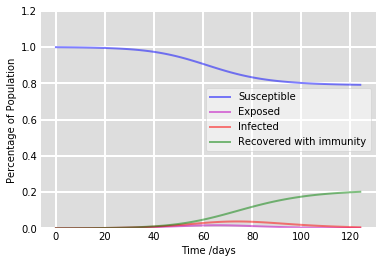

19.73


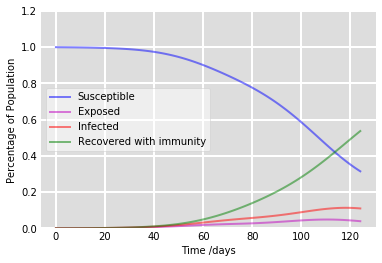

53.26


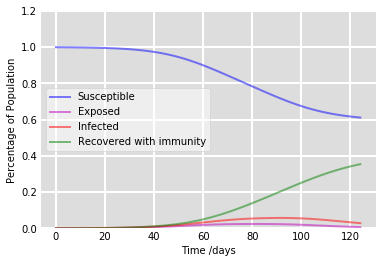

34.98


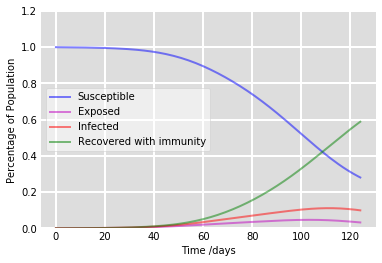

58.4


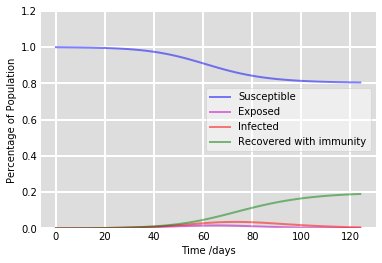

18.55


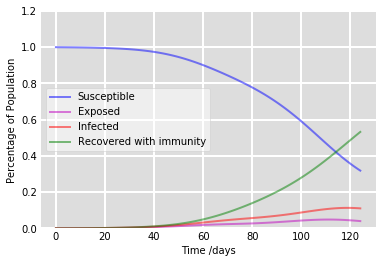

52.78


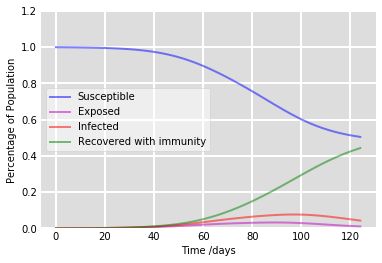

43.86


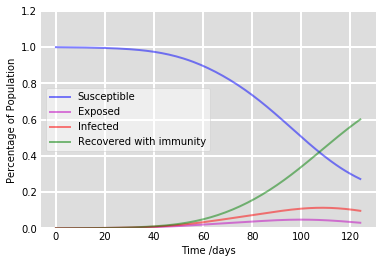

59.68


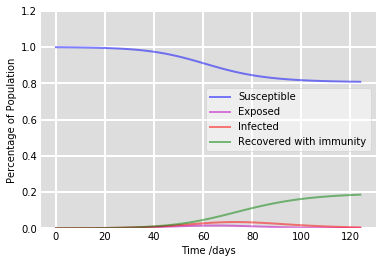

18.15


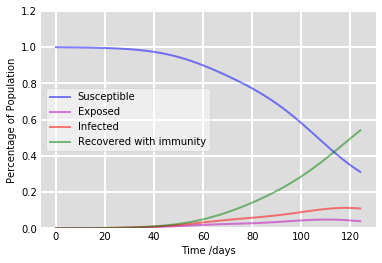

53.65


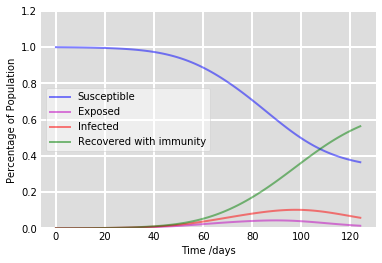

55.91


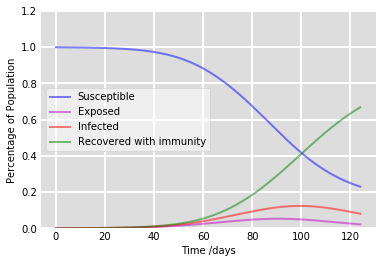

66.4


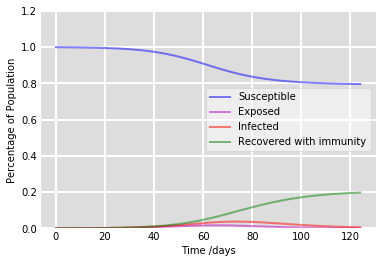

19.33


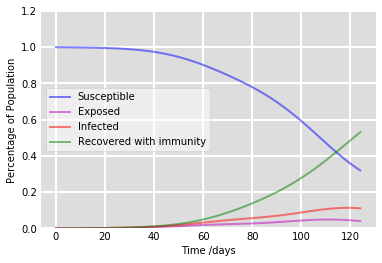

52.65


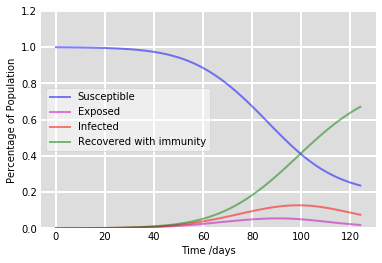

66.64


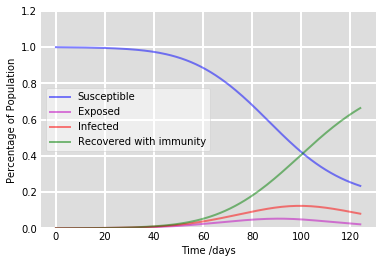

65.94


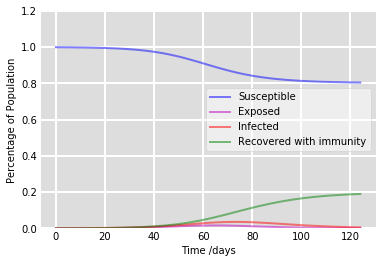

18.55


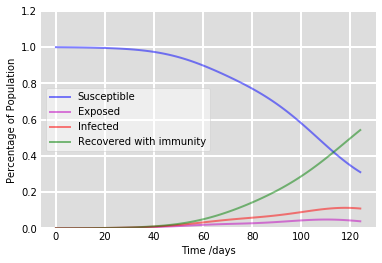

53.81


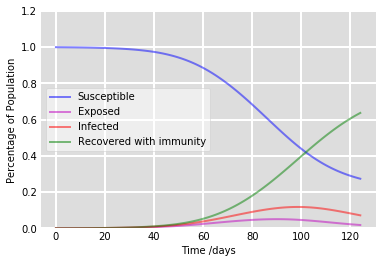

63.26


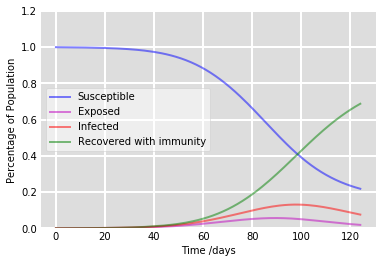

68.32


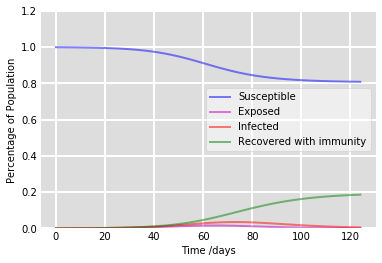

18.15


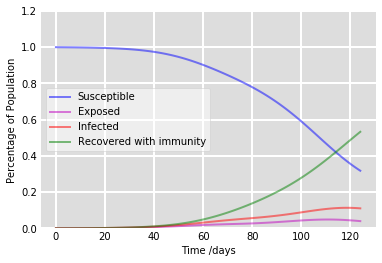

52.84


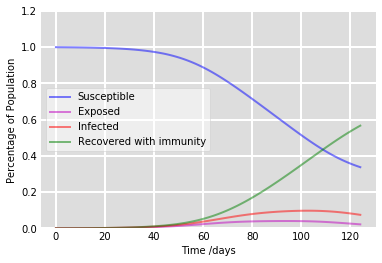

56.23


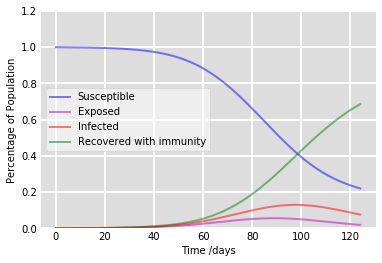

68.12


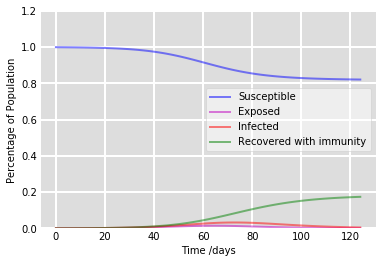

16.96


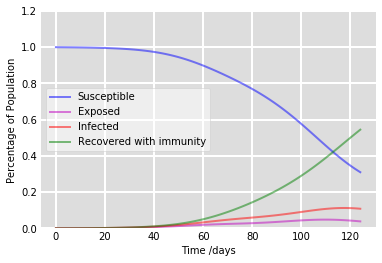

54.01


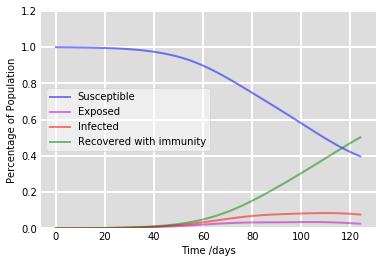

49.78


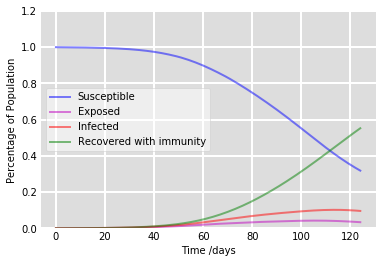

54.8


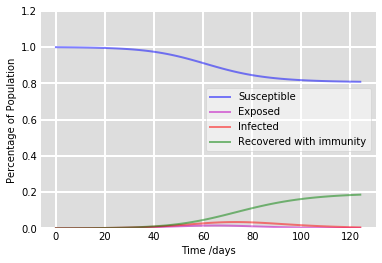

18.15


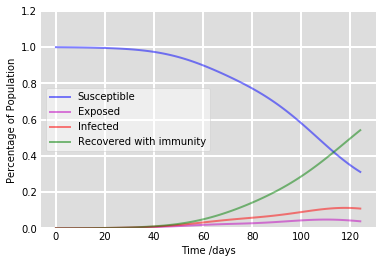

53.74


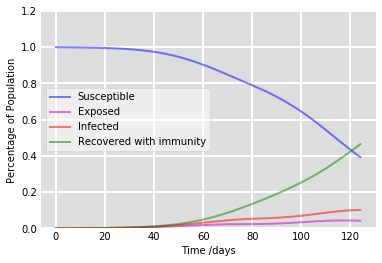

46.02


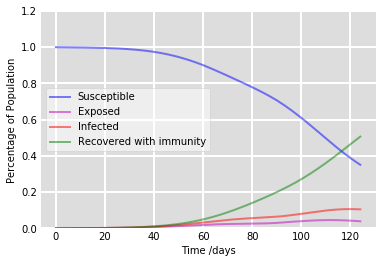

50.2


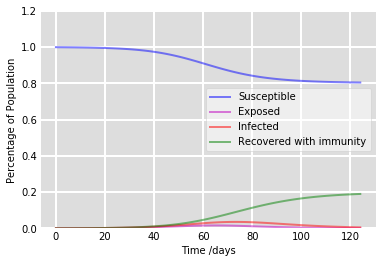

18.55


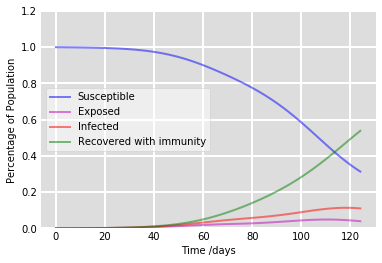

53.38


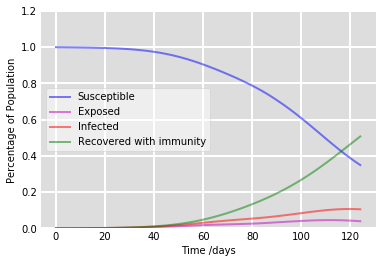

50.29


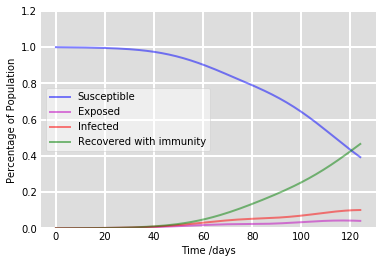

46.13


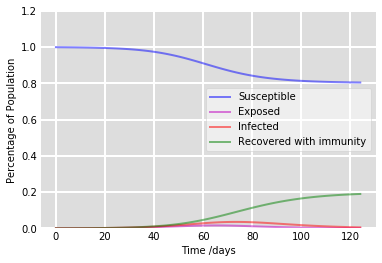

18.54


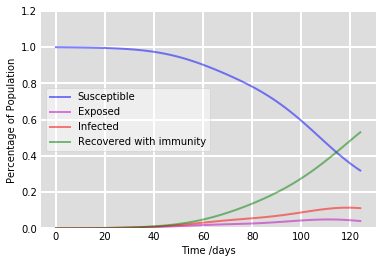

52.59


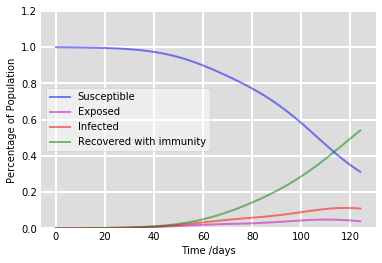

53.62


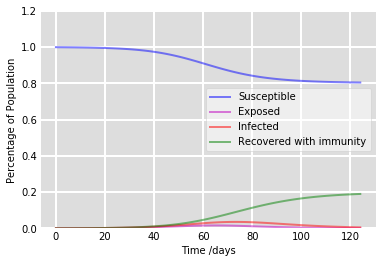

18.55


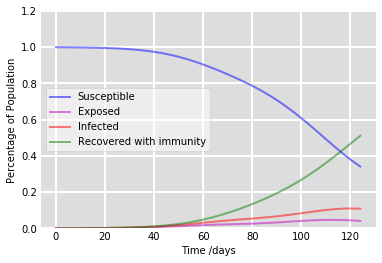

50.65


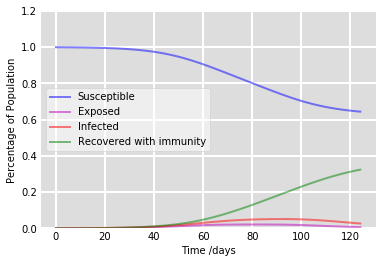

31.96


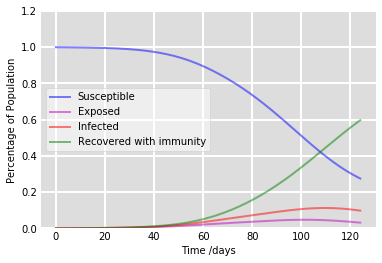

59.24


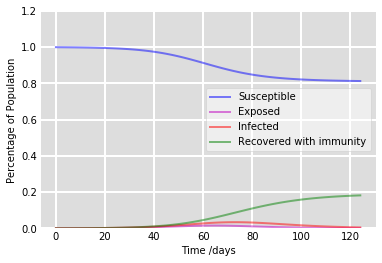

17.76


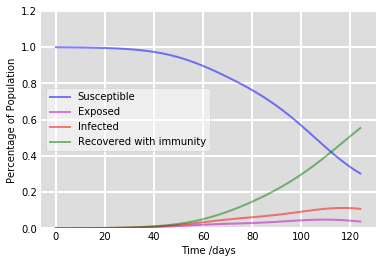

54.88


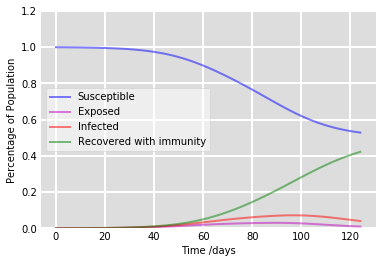

41.79


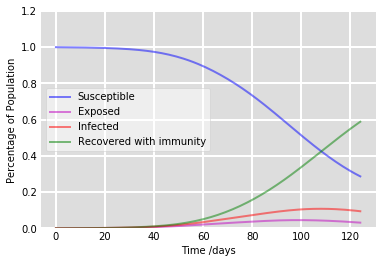

58.4


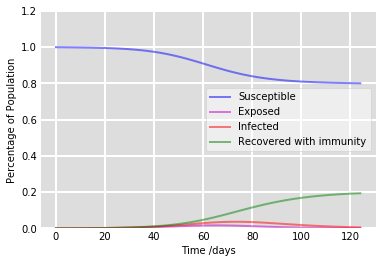

18.94


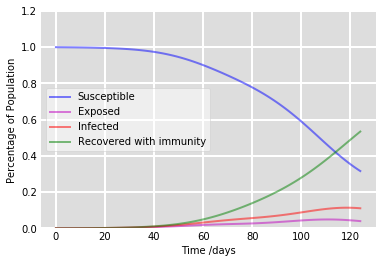

52.98


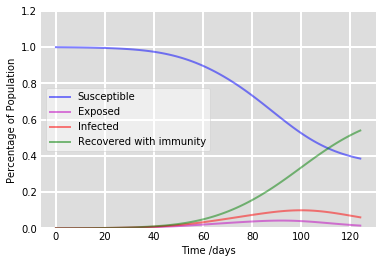

53.56


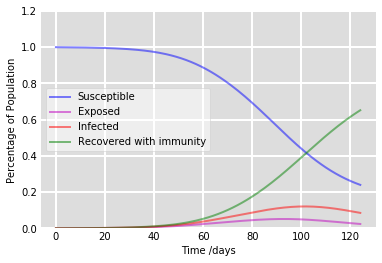

64.74


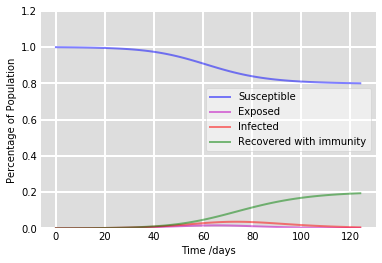

18.94


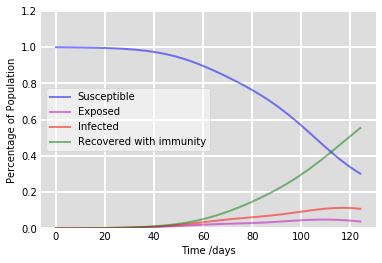

54.91


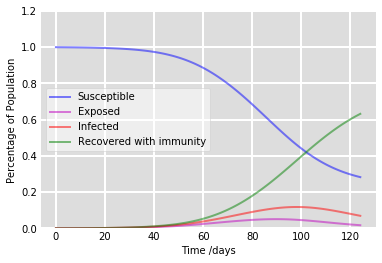

62.75


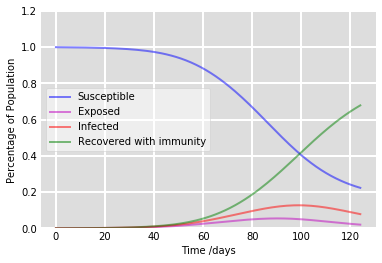

67.42


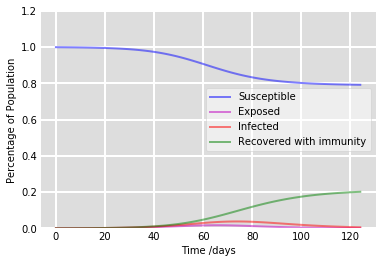

19.73


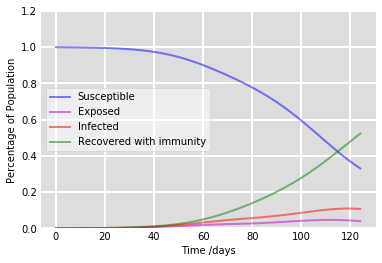

51.9


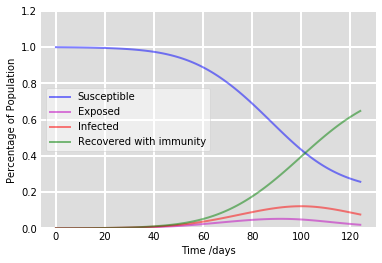

64.35


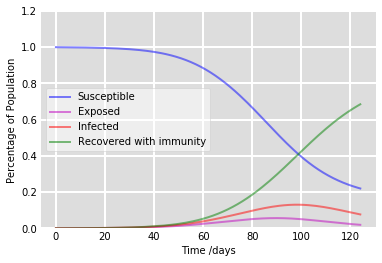

68.03


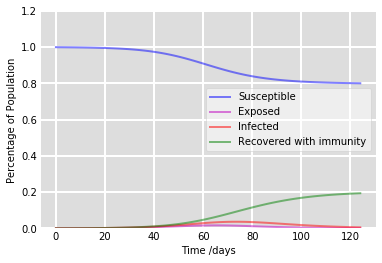

18.94


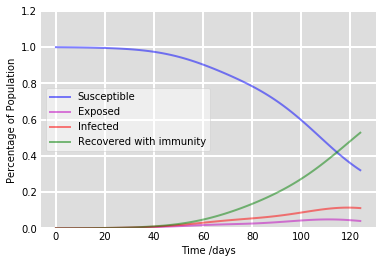

52.35


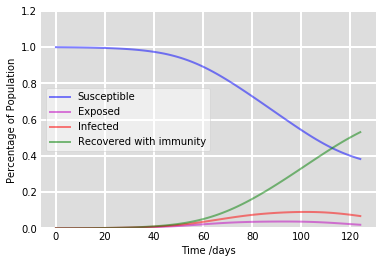

52.65


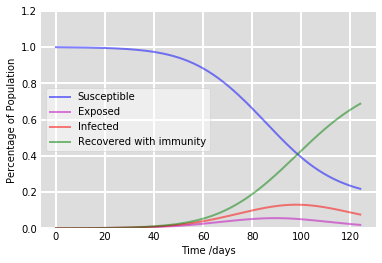

68.33


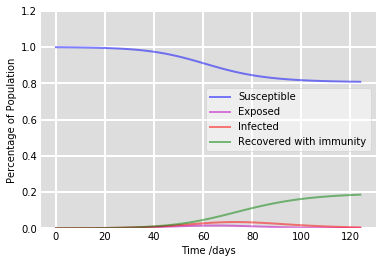

18.15


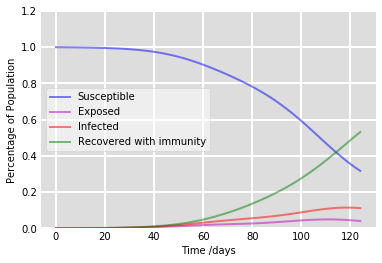

52.76


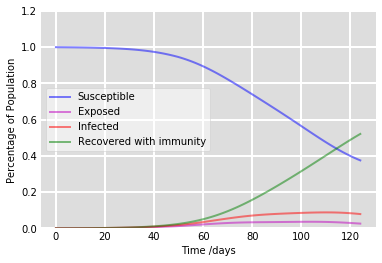

51.66


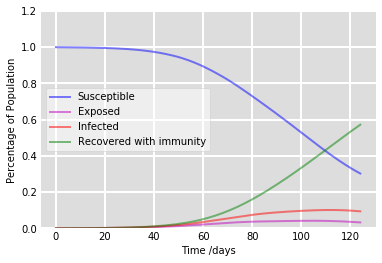

56.74


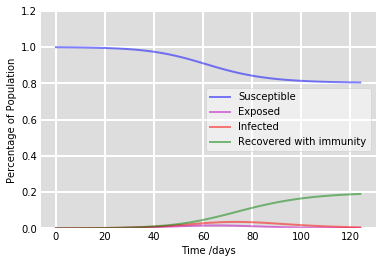

18.54


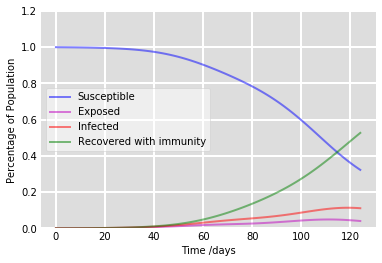

52.24


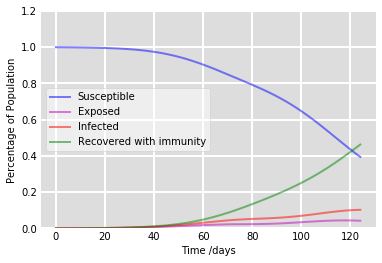

45.82


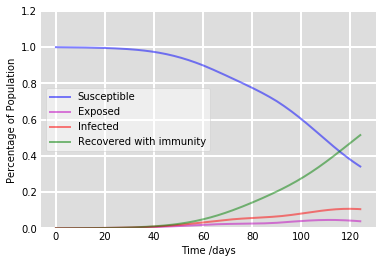

51.03


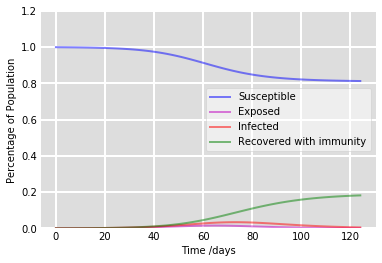

17.75


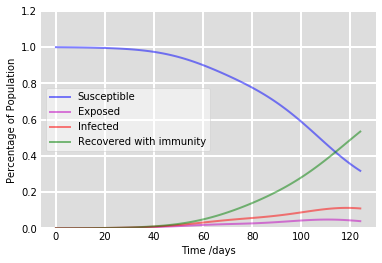

52.98


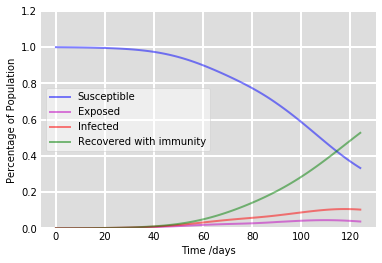

52.27


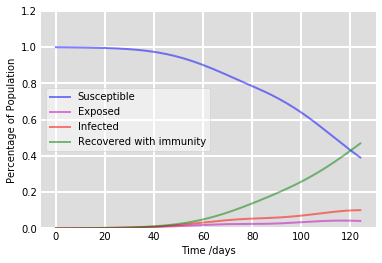

46.42


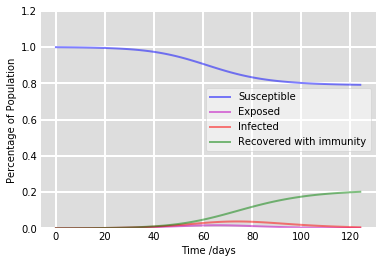

19.73


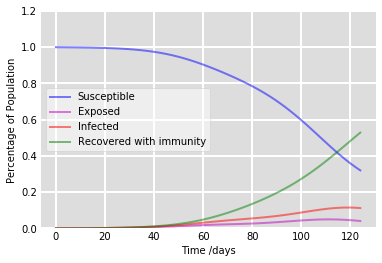

52.4


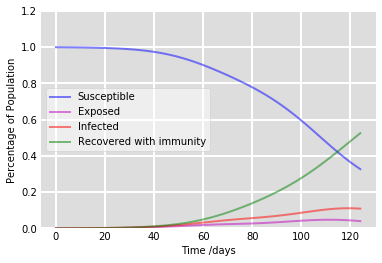

52.09


In [11]:
ans_list = []

for a in range(10):

    for i in range(len(durations)):

        ######### 0 stop
        pop = Population()
        mixing_days = 0 #true for 0 stop


        pop.initialize_uniform_params(num_boxes = num_boxes, N_total = N, p = p, lam = lam, sigma = sigma, p2 = p2, gamma = gamma, q = q)

        pop.distribute_SEIR(E0, I0)


        #Begin integrating
        pop.integrate_event(num_days = total_days)


        label = ['run', str(a), 'zero stops', str(durations[i]), 'days']
        label = '_'.join(label)
        path_name = title + label
        plot_sir(pop.t,pop, path_name = path_name)
        result = round((pop.R[-1]-pop.R[days_before-1])/pop.N * 100,2)
        ans[3][i] = result
        print(result)




        ########## 1 stop

        pop = Population()
        mixing_days = total_days - days_before #true for 1 stop


        pop.initialize_uniform_params(num_boxes = num_boxes, N_total = N, p = p, lam = lam, sigma = sigma, p2 = p2, gamma = gamma, q = q)

        pop.distribute_SEIR(E0, I0)


        #Begin integrating
        pop.integrate_event(num_days = days_before)

        ##Mixing event
        #mats = [left_sto(m, num_boxes),left_sto(m, num_boxes),left_sto(m, num_boxes),left_sto(m, num_boxes)]

        # Simulation for different types of travels,
        # Each type i is characterized by (p_i, r_i), where
        # p_i: proportion of population in type i
        # r_i: proportion of boxes reachable in type i
        # Data for (p_i, r_i) can be obtained on website
        # https://www.bts.gov/browse-statistical-products-and-data/trips-distance/explore-us-mobility-during-covid-19-pandemic

        # Multi-modal travel
        p_tr = np.multiply(np.array([0.01, 0.05, 0.1,  0.5]), scenarios[-1])
        rad  = np.multiply(np.array([1,    0.1, 0.01, 0.001]), scenarios[-1])
        mats = [multimodal_travel(num_boxes, p_tr, rad), multimodal_travel(num_boxes, p_tr, rad), multimodal_travel(num_boxes, p_tr, rad), multimodal_travel(num_boxes, p_tr, rad)]


        pop.integrate_event(num_days = mixing_days, mixing_mats = mats)

        label = ['run', str(a), 'one stop', str(durations[i]), 'days']
        label = '_'.join(label)
        path_name = title + label
        plot_sir(pop.t,pop, path_name = path_name)
        result = round((pop.R[-1]-pop.R[days_before-1])/pop.N * 100,2)
        ans[2][i] = result
        print(result)



        ############ 2 stops

        pop = Population()
        mixing_days = durations[i]
        post_mixing_days = total_days - days_before - mixing_days #true for 1 stop


        pop.initialize_uniform_params(num_boxes = num_boxes, N_total = N, p = p, lam = lam, sigma = sigma, p2 = p2, gamma = gamma, q = q)

        pop.distribute_SEIR(E0, I0)


        #Begin integrating
        pop.integrate_event(num_days = days_before)

        ##Mixing event
        #mats = [left_sto(m, num_boxes),left_sto(m, num_boxes),left_sto(m, num_boxes),left_sto(m, num_boxes)]
        # Multi-modal travel
        p_tr = np.multiply(np.array([0.01, 0.05, 0.1,  0.5]), scenarios[-1])
        rad  = np.multiply(np.array([1,    0.1, 0.01, 0.001]), scenarios[-1])
        mats = [multimodal_travel(num_boxes, p_tr, rad), multimodal_travel(num_boxes, p_tr, rad), multimodal_travel(num_boxes, p_tr, rad), multimodal_travel(num_boxes, p_tr, rad)]

        pop.integrate_event(num_days = mixing_days, mixing_mats = mats)

        pop.integrate_event(num_days = post_mixing_days)

        label = ['run', str(a), 'two stops', str(durations[i]), 'days']
        label = '_'.join(label)
        path_name = title + label
        plot_sir(pop.t,pop, path_name = path_name)
        result = round((pop.R[-1]-pop.R[days_before-1])/pop.N * 100,2)
        ans[1][i] = result
        print(result)



        ################## 3 stops

        pop = Population()
        if i < len(durations) - 1:
            mixing_days = int(durations[i+1]/2) #1 day mixing is N/A
            post_mixing_days = total_days - days_before - 2*mixing_days


            pop.initialize_uniform_params(num_boxes = num_boxes, N_total = N, p = p, lam = lam, sigma = sigma, p2 = p2, gamma = gamma, q = q)

            pop.distribute_SEIR(E0, I0)


            #Begin integrating
            pop.integrate_event(num_days = days_before)

            ##Mixing event
            #mats = [left_sto(m, num_boxes),left_sto(m, num_boxes),left_sto(m, num_boxes),left_sto(m, num_boxes)]
            # Multi-modal travel
            p_tr = np.multiply(np.array([0.01, 0.05, 0.1,  0.5]), scenarios[-1])
            rad  = np.multiply(np.array([1,    0.1, 0.01, 0.001]), scenarios[-1])
            mats = [multimodal_travel(num_boxes, p_tr, rad), multimodal_travel(num_boxes, p_tr, rad), multimodal_travel(num_boxes, p_tr, rad), multimodal_travel(num_boxes, p_tr, rad)]



            pop.integrate_event(num_days = mixing_days, mixing_mats = mats)

            pop.integrate_event(num_days = mixing_days, mixing_mats = False, update_param = False)

            # Multi-modal travel
            p_tr = np.multiply(np.array([0.01, 0.05, 0.1,  0.5]), scenarios[-1])
            rad  = np.multiply(np.array([1,    0.1, 0.01, 0.001]), scenarios[-1])
            mats = [multimodal_travel(num_boxes, p_tr, rad), multimodal_travel(num_boxes, p_tr, rad), multimodal_travel(num_boxes, p_tr, rad), multimodal_travel(num_boxes, p_tr, rad)]

            pop.integrate_event(num_days = post_mixing_days, mixing_mats = mats)



            label = ['run', str(a), 'three stops', str(durations[i+1]), 'days']
            label = '_'.join(label)
            path_name = title + label
            plot_sir(pop.t,pop, path_name = path_name)
            result = round((pop.R[-1]-pop.R[days_before-1])/pop.N * 100,2)
            ans[0][i+1] = result
            print(result)
        
    ans_mat = np.matrix(ans)
    ans_list.append(ans_mat)

In [12]:
mean_matrix = sum(ans_list)/len(ans_list)
std_dev_mats = []

for i in range(len(ans_list)):
    mat1 = ans_list[i]-mean_matrix
    square = np.multiply(mat1, mat1)
    std_dev_mats.append(square)

sum_std_mat = sum(std_dev_mats)/len(std_dev_mats)
std_dev_matrix = np.power(sum_std_mat, 0.5)

### Heat Map

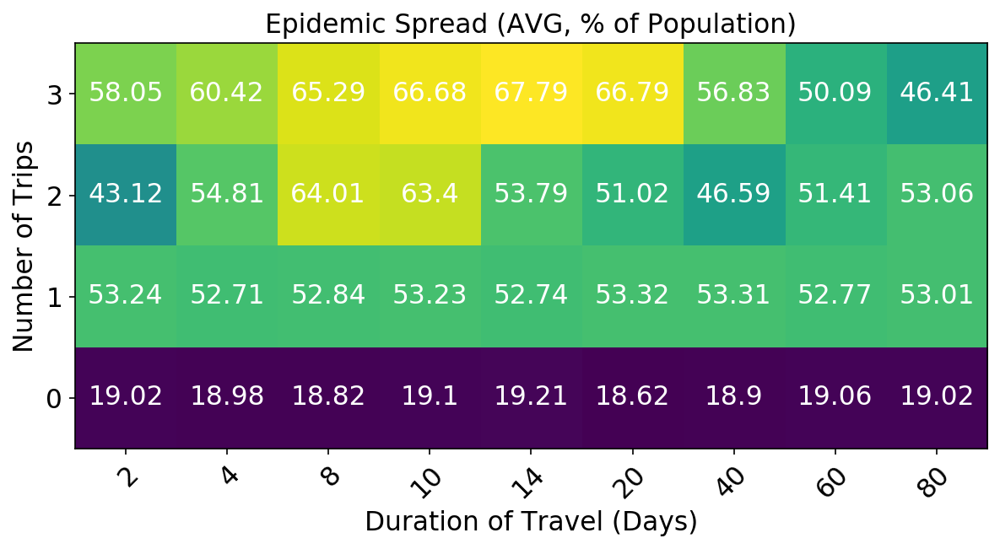

In [13]:
#Heat Map:
x = ["2", "4", "8", "10", "14", "20", "40", "60","80"]#in quotes, x axis labels
y = ["3", "2", "1", "0"]# in quotes, y axis labels


fig, ax = plt.subplots(figsize = (8, 8), dpi = 150)
im = ax.imshow(mean_matrix[:,1:])

# We want to show all ticks...
ax.set_xticks(np.arange(len(x)))
ax.set_yticks(np.arange(len(y)))
# ... and label them with the respective list entries
ax.set_xticklabels(x, fontsize = 15)
ax.set_yticklabels(y, fontsize = 15)
ax.set_xlabel("Duration of Travel (Days)", fontsize = 15)#x axis label
ax.set_ylabel("Number of Trips", fontsize = 15)#y axis label
# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
for i in range(len(y)):
    for j in range(len(x)):
        text = ax.text(j, i, round(mean_matrix[i,j+1],2),
                       ha="center", va="center", color="w", fontsize = 15)

# Spread between Day 30 and day 124
ax.set_title("Epidemic Spread (AVG, % of Population)", fontsize = 15)#Figure title
fig.tight_layout()
path_name = title + "heatmap_avg"
plt.savefig(path_name)
plt.show()
plt.close()

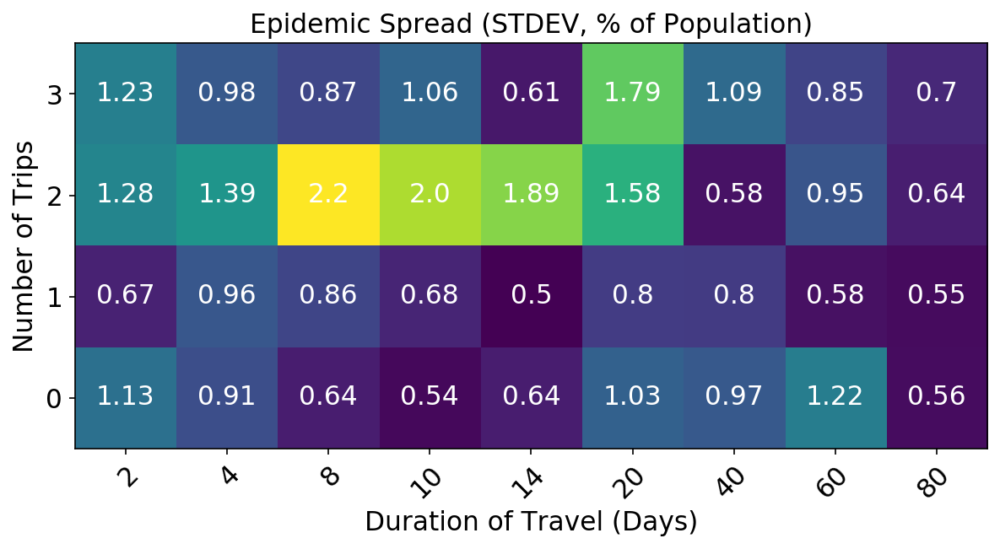

In [14]:
#Heat Map:
x = ["2", "4", "8", "10", "14", "20", "40", "60","80"]#in quotes, x axis labels
y = ["3", "2", "1", "0"]# in quotes, y axis labels


fig, ax = plt.subplots(figsize = (8, 8), dpi = 150)
im = ax.imshow(std_dev_matrix[:,1:])

# We want to show all ticks...
ax.set_xticks(np.arange(len(x)))
ax.set_yticks(np.arange(len(y)))
# ... and label them with the respective list entries
ax.set_xticklabels(x, fontsize = 15)
ax.set_yticklabels(y, fontsize = 15)
ax.set_xlabel("Duration of Travel (Days)", fontsize = 15)#x axis label
ax.set_ylabel("Number of Trips", fontsize = 15)#y axis label
# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
for i in range(len(y)):
    for j in range(len(x)):
        text = ax.text(j, i, round(std_dev_matrix[i,j+1],2),
                       ha="center", va="center", color="w", fontsize = 15)

# Spread between Day 30 and day 124
ax.set_title("Epidemic Spread (STDEV, % of Population)", fontsize = 15)#Figure title
fig.tight_layout()
path_name = title + "heatmap_stdv"
plt.savefig(path_name)
plt.show()
plt.close()